# **Assessment 2**

For our second assessment, we will be looking at sequential weather data. The data contains a number of relevant weather variables, recorded daily for a European city during a period of four decades.

However, this dataset has been corrupted, and some of the daily measurements are now missing. The goal of this assessment is to develop a neural network architecture that can recover the missing measurements!

<br>

---

<br>

The dataset has been saved as `.csv` files and has been separated into a `training_set/` folder and a `test_set.csv` file. The `training_set/` contains data for three of the four decades, separated in one individual file per decade:

- `training_set_0.csv` contains corrupted data for the first decade; `training_set_0_nogaps.csv` contains the same data before it was corrupted.
- `training_set_1.csv` contains corrupted data for the second decade; `training_set_1_nogaps.csv` contains the same data before it was corrupted.
- `training_set_2.csv` contains corrupted data for the third decade; `training_set_2_nogaps.csv` contains the same data before it was corrupted.

The `test_set.csv` file contains the remaining decade; this data is corrupted and contains gaps, but we have lost access to the data before corruption.

The architecture that you design in this assessment should use the data contained inside the `training_set` in order to recover the missing information in the data in `test_set.csv`. Note that decades `0`, `1`, and `2` are not necessarily consecutive.

Inside each of the `.csv` files, you will find the following columns:

- `date`
- `cloud_cover`
- `sunshine`
- `global_radiation`
- `max_temp`
- `mean_temp`
- `min_temp`
- `precipitation`
- `pressure`

<br>

All answers to the assessment should be contained within the structure below, but you are free to add new code and text cells as required to your answers. Read the text for each question and follow the instructions carefully. Answers that do not follow this structure will not be marked. **Do NOT change the name of this file.**

Please, **make sure to execute all your cells and save the result of the execution**. We will only mark cells that have been executed and will not execute any cells ourselves.

<br>

---

<br>

<br><br>

## **Question 1**  (25%)

Load the training and test datasets. Then, use the space below to present the following set of figures:

1. Using line plots, show the different variables in each dataset, both before and after corruption. Choose a single decade to plot, and plot the first 365 days of data. Plot the time series for each variable in an independent axis window. Make sure the axis windows are sized appropriately so that trends and corruption in the variables can be easily observed.
2. Plot a histogram for each variable in each dataset, across all decades, both before and after corruption.

<br>

## Solution to Question 1
First, install all the relevant modules and packages and mount to google drive:

In [1]:
!pip install livelossplot

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader, TensorDataset
from livelossplot import PlotLosses
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import StandardScaler
import random

In [3]:
from google.colab import drive
drive.mount('/content/gdrive/', force_remount=True)

Mounted at /content/gdrive/


In [4]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

set_seed(42)

Create a PATH variables to make it easier to access the file later:

In [5]:
PATH = "/content/gdrive/MyDrive/assessment_2/"

To load all the files:

In [49]:
training_set_0 = pd.read_csv(PATH + 'training_set/training_set_0.csv')
training_set_0_nogaps = pd.read_csv(PATH + 'training_set/training_set_0_nogaps.csv')

training_set_1 = pd.read_csv(PATH + 'training_set/training_set_1.csv')
training_set_1_nogaps = pd.read_csv(PATH + 'training_set/training_set_1_nogaps.csv')

training_set_2 = pd.read_csv(PATH + 'training_set/training_set_2.csv')
training_set_2_nogaps = pd.read_csv(PATH + 'training_set/training_set_2_nogaps.csv')

test_set = pd.read_csv(PATH + 'test_set.csv')

To double check that the data contains the correct number of days in a decade and number of variables:

In [50]:
print(training_set_0.shape)
print(training_set_0_nogaps.shape)
print(training_set_1.shape)
print(training_set_1_nogaps.shape)
print(training_set_2.shape)
print(training_set_2_nogaps.shape)

(3652, 9)
(3652, 9)
(3651, 9)
(3651, 9)
(3651, 9)
(3651, 9)


`training_set_0.csv` and `training_set_0_nogaps.csv` are choosen for the line plots as demonstration:

The following is to check the csv files has been read properly:

In [51]:
training_set_0.head()

,date,cloud_cover,sunshine,global_radiation,max_temp,mean_temp,min_temp,precipitation,pressure
0,0,4.0,0.2,10.6,2.1,-1.3,-4.2,0.0,101282.7
1,1,2.0,6.7,58.8,11.4,-2.1,-6.0,0.2,102455.7
2,2,7.9,-0.0,5.7,9.6,NaN,-5.8,9.9,101920.4
3,3,4.9,4.1,41.1,8.0,NaN,0.8,0.0,100441.5
4,4,3.9,1.3,19.5,8.4,NaN,1.7,0.0,100625.2


In [52]:
training_set_0_nogaps.head()

,date,cloud_cover,sunshine,global_radiation,max_temp,mean_temp,min_temp,precipitation,pressure
0,0,4.0,0.2,10.6,2.1,-1.3,-4.2,0.0,101282.7
1,1,2.0,6.7,58.8,11.4,-2.1,-6.0,0.2,102455.7
2,2,7.9,-0.0,5.7,9.6,3.0,-5.8,9.9,101920.4
3,3,4.9,4.1,41.1,8.0,4.7,0.8,0.0,100441.5
4,4,3.9,1.3,19.5,8.4,4.8,1.7,0.0,100625.2


In [53]:
columns = [col for col in training_set_0.columns if col != 'date'] # Get all columns except date

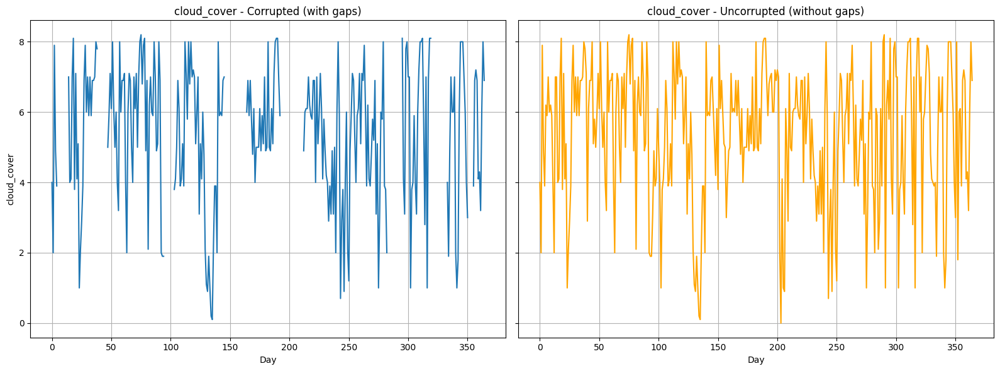

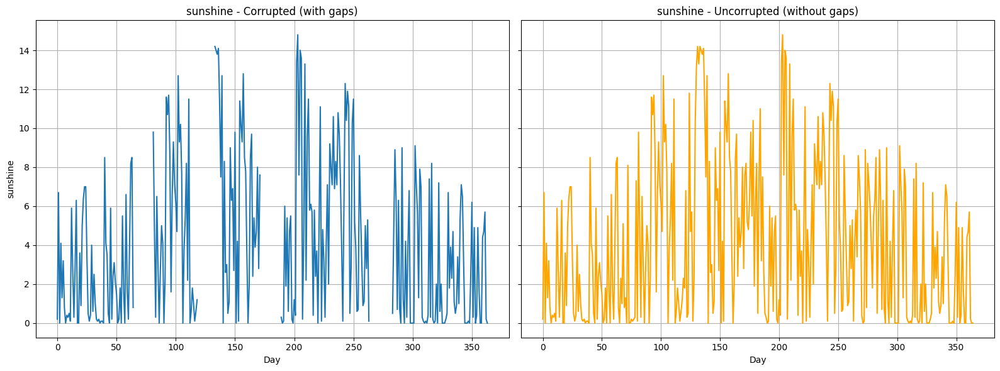

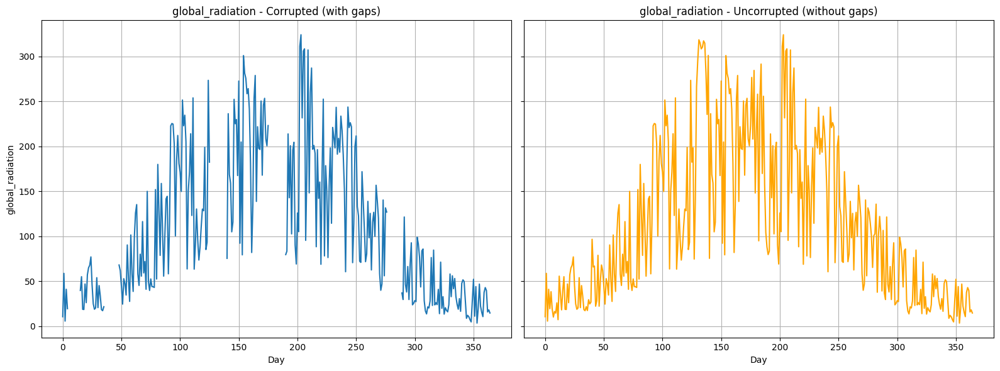

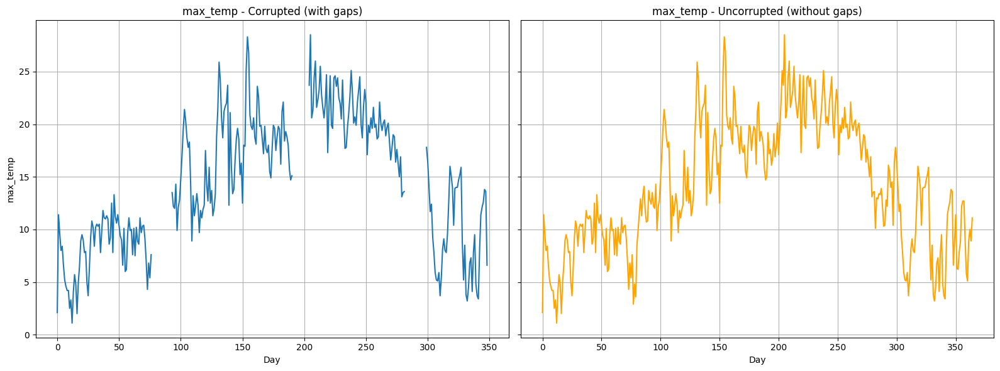

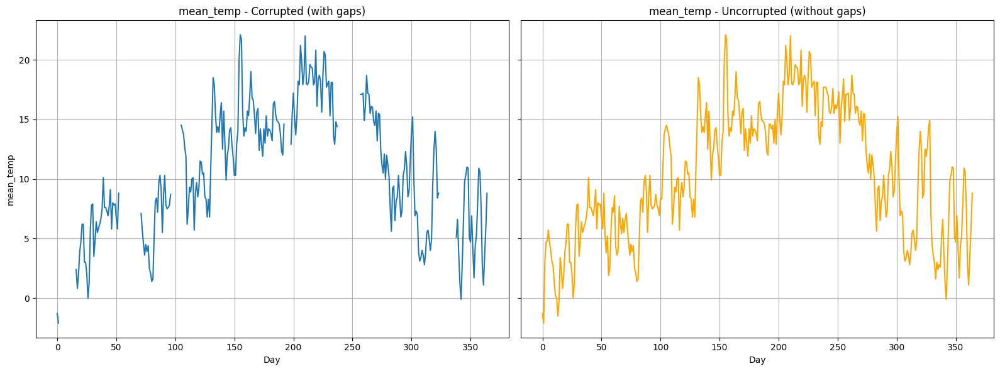

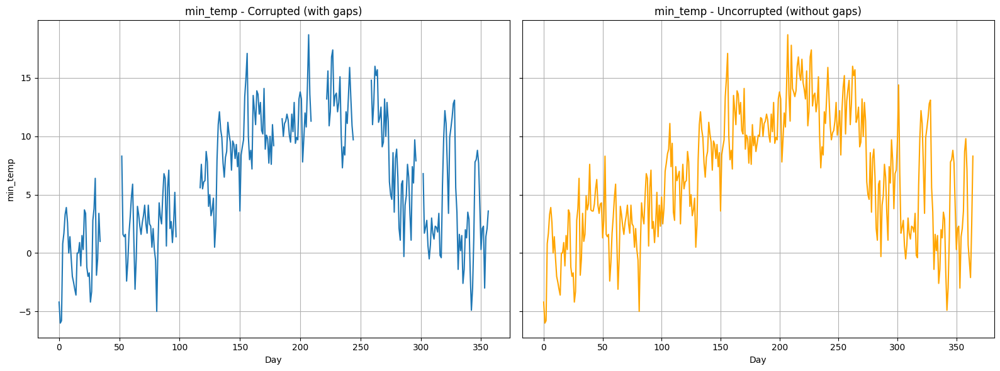

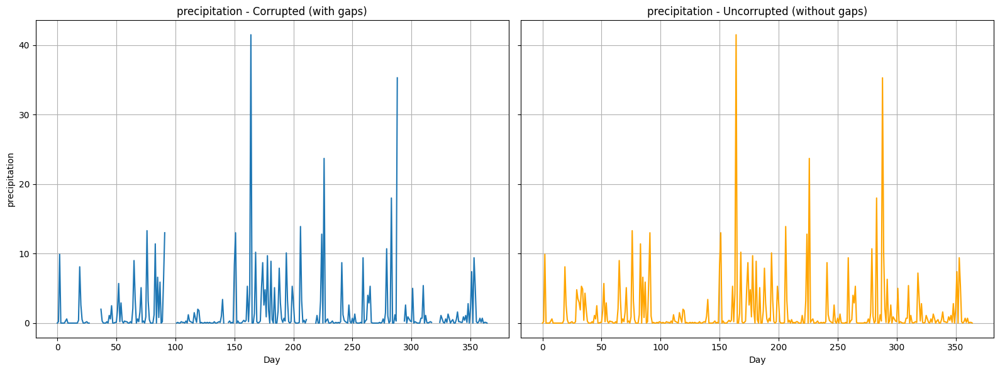

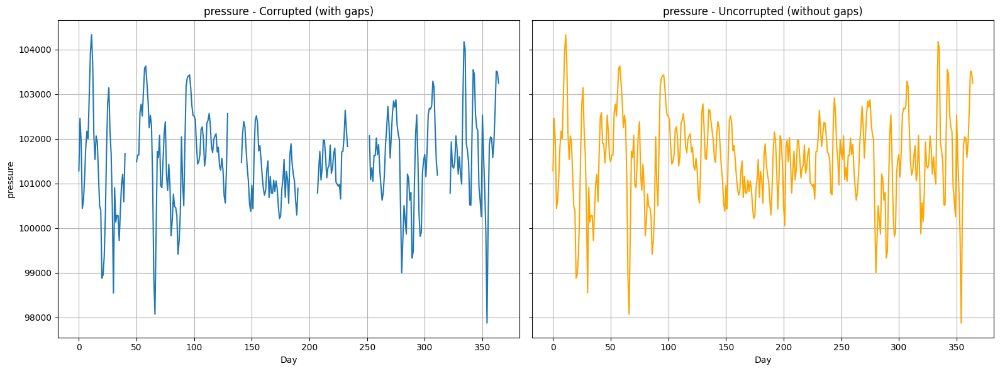

In [54]:


# Plot side-by-side line plots for corrupted (with gaps) and uncorrupted (without gaps)
for column in columns:  # Iterate through all variables except 'date'
    fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

    # Corrupted (with gaps)
    axes[0].plot(training_set_0[column][:365], label='With gaps')
    axes[0].set_title(f'{column} - Corrupted (with gaps)')
    axes[0].set_xlabel('Day')
    axes[0].set_ylabel(column)
    axes[0].grid(True)

    # Uncorrupted (without gaps)
    axes[1].plot(training_set_0_nogaps[column][:365], label='Without gaps', color='orange')
    axes[1].set_title(f'{column} - Uncorrupted (without gaps)')
    axes[1].set_xlabel('Day')
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()



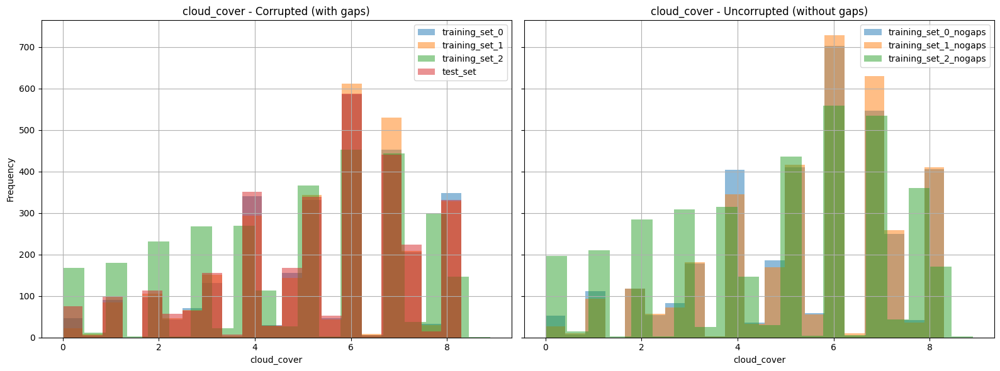

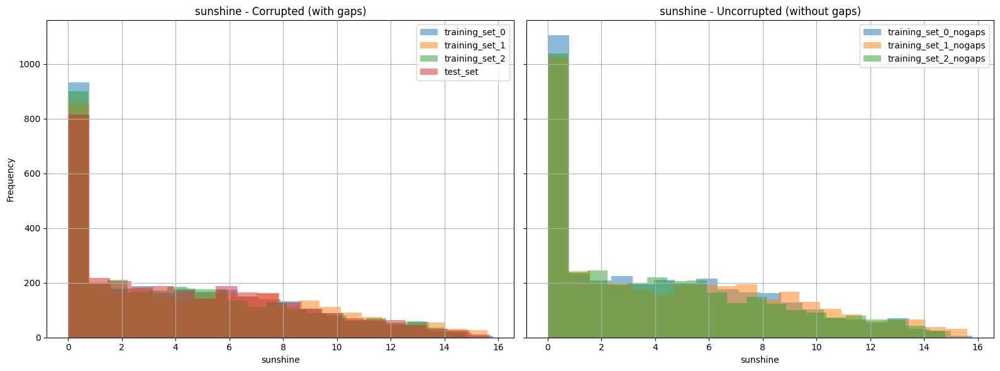

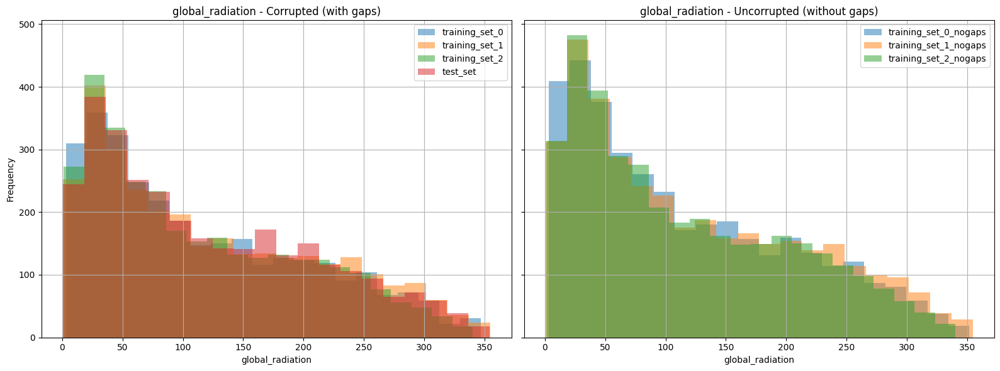

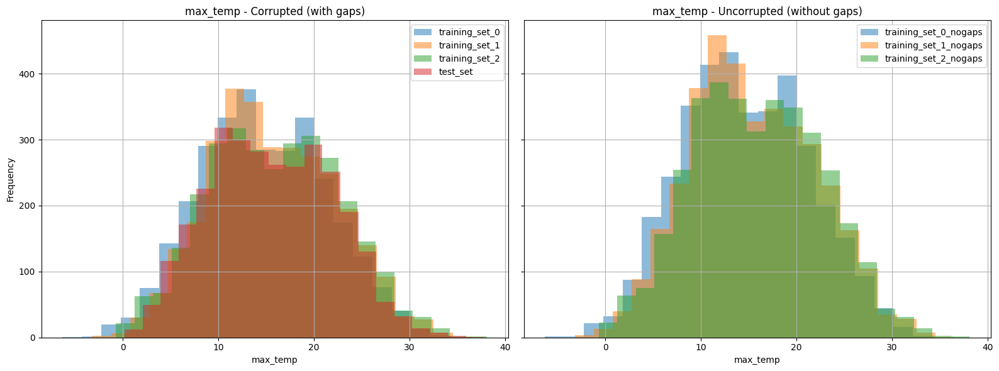

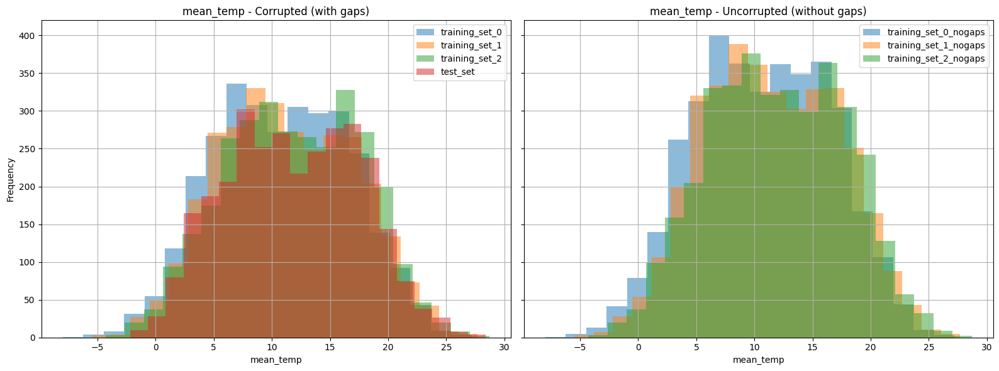

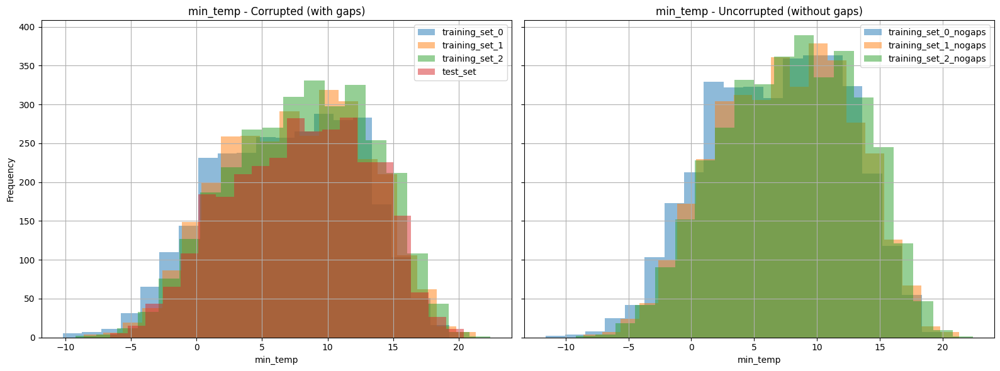

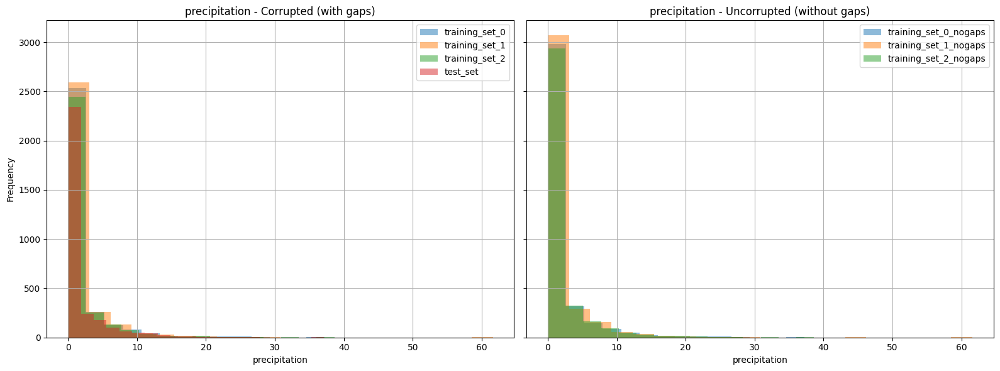

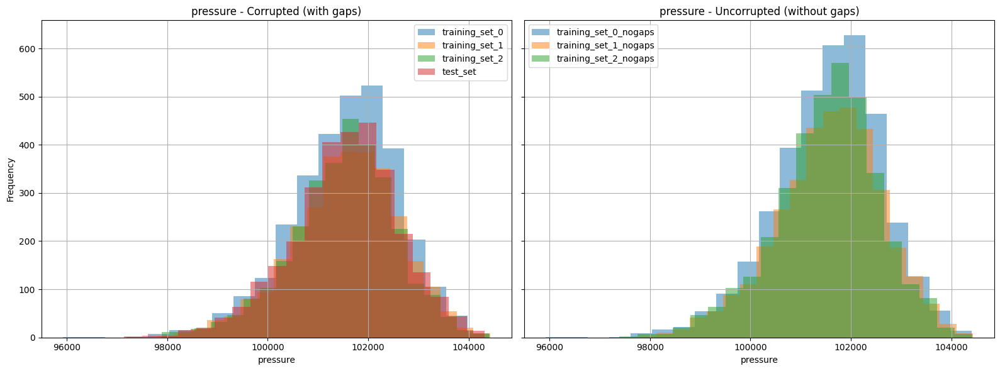

In [55]:
# Define the training set lists and corresponding names
training_set_total_list_corrupted = [training_set_0, training_set_1, training_set_2, test_set]
training_set_total_list_uncorrupted = [training_set_0_nogaps, training_set_1_nogaps, training_set_2_nogaps]
dataset_names_corrupted = ["training_set_0", "training_set_1", "training_set_2", "test_set"]
dataset_names_uncorrupted = ["training_set_0_nogaps", "training_set_1_nogaps", "training_set_2_nogaps"]

# Combine corrupted datasets for labeling
datasets_corrupted = []
for df, name in zip(training_set_total_list_corrupted, dataset_names_corrupted):
    df_copy = df.copy()
    df_copy['dataset_label'] = name
    datasets_corrupted.append(df_copy)
combined_data_corrupted = pd.concat(datasets_corrupted, ignore_index=True)

# Combine uncorrupted datasets for labeling
datasets_uncorrupted = []
for df, name in zip(training_set_total_list_uncorrupted, dataset_names_uncorrupted):
    df_copy = df.copy()
    df_copy['dataset_label'] = name
    datasets_uncorrupted.append(df_copy)
combined_data_uncorrupted = pd.concat(datasets_uncorrupted, ignore_index=True)

# Plot histograms for each variable side by side
for column in columns:
    fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

    # Corrupted (with gaps)
    for name in dataset_names_corrupted:
        data = combined_data_corrupted[combined_data_corrupted['dataset_label'] == name]
        axes[0].hist(data[column].dropna(), bins=20, alpha=0.5, label=name)
    axes[0].set_title(f'{column} - Corrupted (with gaps)')
    axes[0].set_xlabel(column)
    axes[0].set_ylabel('Frequency')
    axes[0].legend()
    axes[0].grid(True)

    # Uncorrupted (without gaps)
    for name in dataset_names_uncorrupted:
        data = combined_data_uncorrupted[combined_data_uncorrupted['dataset_label'] == name]
        axes[1].hist(data[column].dropna(), bins=20, alpha=0.5, label=name)
    axes[1].set_title(f'{column} - Uncorrupted (without gaps)')
    axes[1].set_xlabel(column)
    axes[1].legend()
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()


We can also use the describe function to see the statistical information of each dataset

In [56]:
test_set.describe()

,date,cloud_cover,sunshine,global_radiation,max_temp,mean_temp,min_temp,precipitation,pressure
count,3652.000000,3117.000000,3088.000000,3092.000000,2969.000000,3055.000000,3065.000000,3089.000000,3045.000000
mean,1825.500000,5.286173,4.420402,121.215362,15.584439,11.864452,7.924111,1.813079,101543.529918
std,1054.385919,2.005485,3.975984,88.795834,6.384985,5.708833,5.216791,3.687227,1061.652407
min,0.000000,0.000000,0.000000,0.800000,0.200000,-2.200000,-6.600000,0.000000,97143.700000
25%,912.750000,4.000000,0.600000,43.900000,10.700000,7.600000,4.000000,0.000000,100919.400000
50%,1825.500000,5.900000,3.600000,98.750000,15.400000,11.700000,8.100000,0.200000,101623.000000
75%,2738.250000,7.000000,7.200000,187.325000,20.500000,16.500000,12.100000,1.700000,102246.000000
max,3651.000000,8.300000,15.700000,354.400000,37.800000,28.400000,20.400000,37.100000,104322.500000


<br>

---

<br>

## **Question 2**  (25%)

Using the data loaded in **Question 1**, create a PyTorch `TensorDataset`, and create one `DataLoader` for the training set and another one for the test set.

The training loader should provide batches of weather data that have been corrupted, as well as the corresponding, paired un-corrupted batch of data. The test loader should provide batches of corrupted weather data, with no corresponding uncorrupted labels.

Using line plots, show here one batch from both the training and test datasets before and after corruption. Use different axis windows for input and label of the batch.

<br>



To create a useful dataset, we will have to scale the current data that we have:

In [14]:
def StandardScale_data(df, columns):
    data_scaler = StandardScaler()
    if not isinstance(df, pd.DataFrame):
        df = df[0] # Get the DataFrame from the tuple (assuming it is the first element)
    scaler = data_scaler.fit(df[columns])
    df[columns] = scaler.transform(df[columns])
    return df, scaler

In [29]:
train_set_0 = StandardScale_data(training_set_0, columns)
train_set_0_nogaps = StandardScale_data(training_set_0_nogaps, columns)

train_set_1 = StandardScale_data(training_set_1, columns)
train_set_1_nogaps = StandardScale_data(training_set_1_nogaps, columns)

train_set_2 = StandardScale_data(training_set_2, columns)
train_set_2_nogaps = StandardScale_data(training_set_2_nogaps, columns)

test_set = StandardScale_data(test_set, columns)

In [16]:
dataloaders = []
for i in range(3):  # For each file (training_set_0, training_set_1, etc.)
    # Get the corrupted and uncorrupted data
    corrupted_data = globals()[f"training_set_{i}"]
    uncorrupted_data = globals()[f"training_set_{i}_nogaps"]

    # Convert to PyTorch tensors
    corrupted_tensor = torch.tensor(corrupted_data[columns].values, dtype=torch.float32)
    uncorrupted_tensor = torch.tensor(uncorrupted_data[columns].values, dtype=torch.float32)

    # Create a TensorDataset
    dataset = TensorDataset(corrupted_tensor, uncorrupted_tensor)

    # Create a DataLoader
    dataloader = DataLoader(dataset, batch_size=32, shuffle=False)  # No shuffling to preserve sequence
    dataloaders.append(dataloader)

In [17]:
# Loop through each DataLoader and print its size
for i, dataloader in enumerate(dataloaders):
    num_batches = len(dataloader)  # Number of batches in the DataLoader
    dataset_size = len(dataloader.dataset)  # Total number of rows in the dataset
    print(f"DataLoader {i}:")
    print(f"  Total Dataset Size: {dataset_size} rows")
    print(f"  Batch Size: {dataloader.batch_size}")
    print(f"  Number of Batches: {num_batches}")

DataLoader 0:
  Total Dataset Size: 3652 rows
  Batch Size: 32
  Number of Batches: 115
DataLoader 1:
  Total Dataset Size: 3651 rows
  Batch Size: 32
  Number of Batches: 115
DataLoader 2:
  Total Dataset Size: 3651 rows
  Batch Size: 32
  Number of Batches: 115


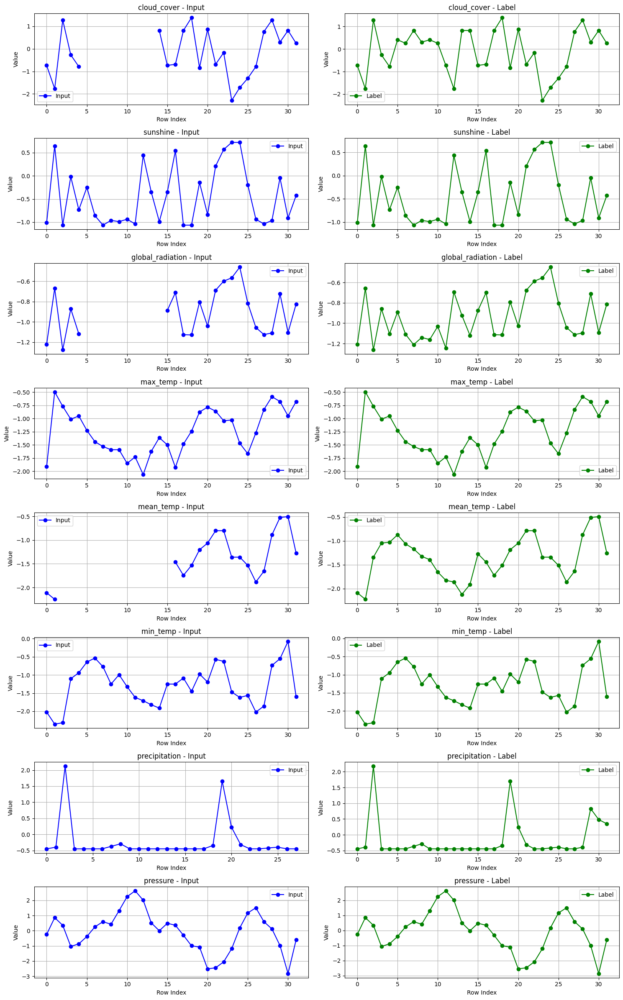

In [18]:
inputs, labels = next(iter(dataloaders[0]))

# Convert tensors to NumPy arrays
inputs_np = inputs.numpy()
labels_np = labels.numpy()

# Number of columns/features
num_cols = inputs_np.shape[1]

# Create a figure with num_cols rows and 2 columns of subplots
# figsize is set to accommodate all subplots neatly
fig, axes = plt.subplots(num_cols, 2, figsize=(15, 3 * num_cols), sharex=False)

# If there's only one column, axes will not be a 2D array. Convert it to one for consistency.
if num_cols == 1:
    axes = axes.reshape(1, -1)

for i in range(num_cols):
    # Plot Input Data
    ax_input = axes[i, 0]
    ax_input.plot(inputs_np[:, i], marker='o', linestyle='-', color='blue', label='Input')
    ax_input.set_title(f'{columns[i]} - Input')
    ax_input.set_xlabel('Row Index')
    ax_input.set_ylabel('Value')
    ax_input.grid(True)
    ax_input.legend()

    # Plot Label Data
    ax_label = axes[i, 1]
    ax_label.plot(labels_np[:, i], marker='o', linestyle='-', color='green', label='Label')
    ax_label.set_title(f'{columns[i]} - Label')
    ax_label.set_xlabel('Row Index')
    ax_label.set_ylabel('Value')
    ax_label.grid(True)
    ax_label.legend()

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the combined plots
plt.show()


In [19]:
test_loader = DataLoader(TensorDataset(torch.tensor(test_set[0][columns].values, dtype=torch.float32)), batch_size=32, shuffle=False)

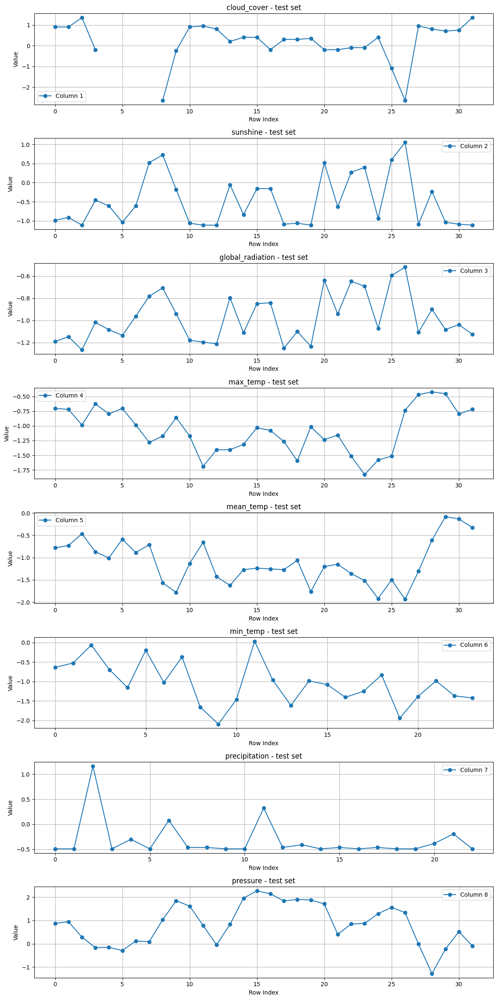

In [20]:
data = next(iter(test_loader))[0]
# Convert to NumPy
data_np = data.numpy()

# Number of columns
num_cols = data_np.shape[1]

# Create subplots
plt.figure(figsize=(12, 3 * num_cols))

for i in range(num_cols):
    plt.subplot(num_cols, 1, i + 1)
    plt.plot(data_np[:, i], marker='o', linestyle='-', label=f'Column {i + 1}')
    plt.title(f'{columns[i]} - test set')
    plt.xlabel('Row Index')
    plt.ylabel('Value')
    plt.grid(True)
    plt.legend()

plt.tight_layout()
plt.show()


In [65]:
def preprocess_training_data(training_set, nogaps_set, standard_scale_columns, log_scale_columns):
    """
    Preprocesses training data by applying StandardScaler and logarithmic transformation.

    Args:
        training_set (pd.DataFrame): Corrupted training data with gaps.
        nogaps_set (pd.DataFrame): Clean training data without gaps.
        standard_scale_columns (list): Columns to apply StandardScaler.
        log_scale_columns (list): Columns to apply log transformation.

    Returns:
        pd.DataFrame: Transformed training set with gaps.
        pd.DataFrame: Transformed clean training set (no gaps).
        dict: Scalers used for StandardScaler columns.
    """
    transformed_training_set = training_set.copy()
    transformed_nogaps_set = nogaps_set.copy()
    scalers = {}

    # Apply StandardScaler, fitted on the clean dataset
    for col in standard_scale_columns:
        scaler = StandardScaler()
        scaler.fit(nogaps_set[[col]])  # Fit only on the clean dataset
        transformed_nogaps_set[col] = scaler.transform(nogaps_set[[col]])
        transformed_training_set[col] = scaler.transform(training_set[[col]])
        scalers[col] = scaler  # Save the scaler

    # Apply log transformation
    for col in log_scale_columns:
        transformed_nogaps_set[col] = np.log1p(nogaps_set[col])
        transformed_training_set[col] = np.log1p(training_set[col])

    return transformed_training_set, transformed_nogaps_set, scalers


In [66]:
standard_scale_columns = ['max_temp',
                          'mean_temp',
                          'min_temp',
                          'pressure']
log_scale_columns = ['cloud_cover',
                      'sunshine',
                      'global_radiation',
                      'precipitation']


transformed_training_set_0, transformed_training_set_0_nogaps, scalers_0 = preprocess_training_data(
    training_set_0, training_set_0_nogaps, standard_scale_columns, log_scale_columns
)
# Preprocess training set 1
transformed_training_set_1, transformed_training_set_1_nogaps, scalers_1 = preprocess_training_data(
    training_set_1, training_set_1_nogaps, standard_scale_columns, log_scale_columns
)

# Preprocess training set 2
transformed_training_set_2, transformed_training_set_2_nogaps, scalers_2 = preprocess_training_data(
    training_set_2, training_set_2_nogaps, standard_scale_columns, log_scale_columns
)

# Preprocess test set using scalers from training set 0 (or other reference set)
# Assuming the test set should be scaled using scalers_0
transformed_test_set = test_set.copy()

# Apply StandardScaler from training_set_0
for col in standard_scale_columns:
    transformed_test_set[col] = scalers_0[col].transform(test_set[[col]])

# Apply log transformation
for col in log_scale_columns:
    transformed_test_set[col] = np.log1p(test_set[col])

# Print results for verification
print("Transformed Training Set 1 (with gaps):")
print(transformed_training_set_1)

print("\nTransformed Training Set 1 (no gaps):")
print(transformed_training_set_1_nogaps)

print("\nTransformed Training Set 2 (with gaps):")
print(transformed_training_set_2)

print("\nTransformed Training Set 2 (no gaps):")
print(transformed_training_set_2_nogaps)

print("\nTransformed Test Set:")
print(transformed_test_set)



Transformed Training Set 1 (with gaps):
      date  cloud_cover  sunshine  global_radiation  max_temp  mean_temp  \
0        0     2.186051  0.182322          2.493205 -0.848579  -1.174653   
1        1     1.945910  0.095310          2.549445 -1.552829  -1.157043   
2        2     2.054124  0.000000          2.867899 -1.047606  -1.262702   
3        3     1.945910  1.163151          3.440418 -0.741411  -1.086604   
4        4     2.066863  0.000000          2.451005 -0.450525  -0.892896   
...    ...          ...       ...               ...       ...        ...   
3646  3646     1.931521  1.568616               NaN -1.506899  -1.033774   
3647  3647     1.824549  0.000000               NaN -1.659997  -1.526849   
3648  3648     1.931521  0.000000               NaN -1.384421  -1.456410   
3649  3649     1.064711  1.774952               NaN -1.170084  -1.579679   
3650  3650     2.066863  0.000000          1.987874 -1.047606  -1.474020   

      min_temp  precipitation  pressure  
0    

In [67]:
transformed_dataloaders = []
for i in range(3):  # For each file (training_set_0, training_set_1, etc.)
    # Get the corrupted and uncorrupted data
    corrupted_data = globals()[f"transformed_training_set_{i}"]
    uncorrupted_data = globals()[f"transformed_training_set_{i}_nogaps"]

    # Convert to PyTorch tensors
    corrupted_tensor = torch.tensor(corrupted_data[columns].values, dtype=torch.float32)
    uncorrupted_tensor = torch.tensor(uncorrupted_data[columns].values, dtype=torch.float32)

    # Create a TensorDataset
    dataset = TensorDataset(corrupted_tensor, uncorrupted_tensor)

    # Create a DataLoader
    dataloader = DataLoader(dataset, batch_size=32, shuffle=False)  # No shuffling to preserve sequence
    dataloaders.append(dataloader)

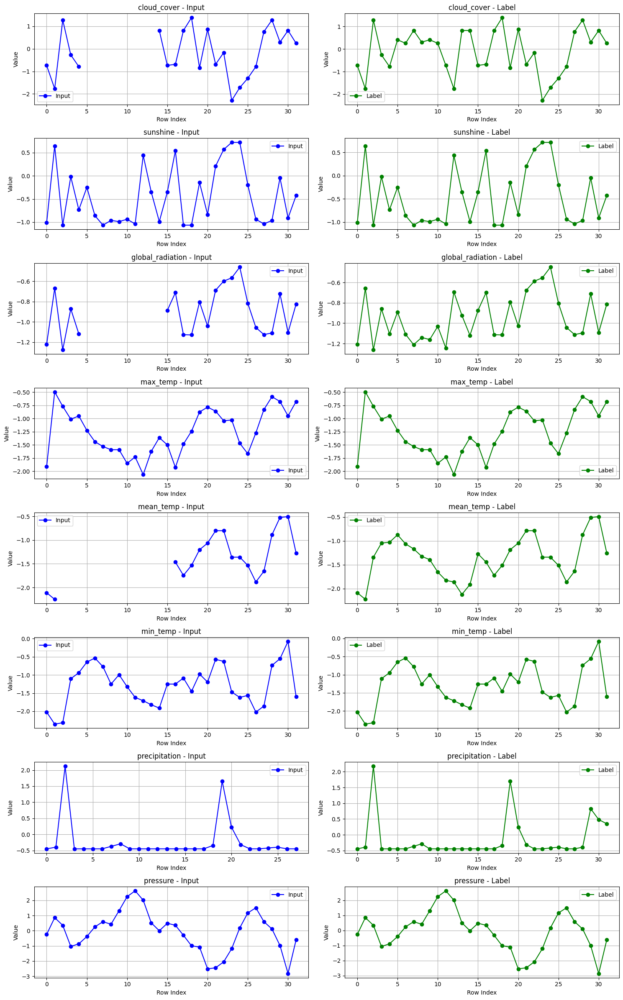

In [68]:
inputs, labels = next(iter(dataloaders[0]))

# Convert tensors to NumPy arrays
inputs_np = inputs.numpy()
labels_np = labels.numpy()

# Number of columns/features
num_cols = inputs_np.shape[1]

# Create a figure with num_cols rows and 2 columns of subplots
# figsize is set to accommodate all subplots neatly
fig, axes = plt.subplots(num_cols, 2, figsize=(15, 3 * num_cols), sharex=False)

# If there's only one column, axes will not be a 2D array. Convert it to one for consistency.
if num_cols == 1:
    axes = axes.reshape(1, -1)

for i in range(num_cols):
    # Plot Input Data
    ax_input = axes[i, 0]
    ax_input.plot(inputs_np[:, i], marker='o', linestyle='-', color='blue', label='Input')
    ax_input.set_title(f'{columns[i]} - Input')
    ax_input.set_xlabel('Row Index')
    ax_input.set_ylabel('Value')
    ax_input.grid(True)
    ax_input.legend()

    # Plot Label Data
    ax_label = axes[i, 1]
    ax_label.plot(labels_np[:, i], marker='o', linestyle='-', color='green', label='Label')
    ax_label.set_title(f'{columns[i]} - Label')
    ax_label.set_xlabel('Row Index')
    ax_label.set_ylabel('Value')
    ax_label.grid(True)
    ax_label.legend()

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the combined plots
plt.show()


In [63]:
def reverse_preprocessing(transformed_df, scalers, log_scale_columns):
    """
    Reverses the transformations applied to the DataFrame.

    Args:
        transformed_df (pd.DataFrame): Transformed DataFrame.
        scalers (dict): Scalers used for StandardScaler columns.
        log_scale_columns (list): Columns that were log-transformed.

    Returns:
        pd.DataFrame: Original DataFrame.
    """
    original_df = transformed_df.copy()

    # Reverse StandardScaler
    for col, scaler in scalers.items():
        original_df[col] = scaler.inverse_transform(transformed_df[[col]])

    # Reverse log transformation
    for col in log_scale_columns:
        original_df[col] = np.expm1(transformed_df[col])  # Reverse log1p

    return original_df


In [64]:
# Reverse transformations for training set 0
original_training_set_0 = reverse_preprocessing(transformed_training_set_0, scalers_0, log_scale_columns)
original_training_set_0_nogaps = reverse_preprocessing(transformed_training_set_0_nogaps, scalers_0, log_scale_columns)

# Reverse transformations for training set 1
original_training_set_1 = reverse_preprocessing(transformed_training_set_1, scalers_1, log_scale_columns)
original_training_set_1_nogaps = reverse_preprocessing(transformed_training_set_1_nogaps, scalers_1, log_scale_columns)

# Reverse transformations for training set 2
original_training_set_2 = reverse_preprocessing(transformed_training_set_2, scalers_2, log_scale_columns)
original_training_set_2_nogaps = reverse_preprocessing(transformed_training_set_2_nogaps, scalers_2, log_scale_columns)

# Reverse transformations for test set (using scalers from training set 0)
original_test_set = reverse_preprocessing(transformed_test_set, scalers_0, log_scale_columns)

# Print results for verification
print("Original Training Set 0 (with gaps):")
print(original_training_set_0)

print("\nOriginal Training Set 0 (no gaps):")
print(original_training_set_0_nogaps)

print("\nOriginal Training Set 1 (with gaps):")
print(original_training_set_1)

print("\nOriginal Training Set 1 (no gaps):")
print(original_training_set_1_nogaps)

print("\nOriginal Training Set 2 (with gaps):")
print(original_training_set_2)

print("\nOriginal Training Set 2 (no gaps):")
print(original_training_set_2_nogaps)

print("\nOriginal Test Set:")
print(original_test_set)


Original Training Set 0 (with gaps):
      date  cloud_cover  sunshine  global_radiation  max_temp  mean_temp  \
0        0          4.0       0.2              10.6       2.1       -1.3   
1        1          2.0       6.7              58.8      11.4       -2.1   
2        2          7.9      -0.0               5.7       9.6        NaN   
3        3          4.9       4.1              41.1       8.0        NaN   
4        4          3.9       1.3              19.5       8.4        NaN   
...    ...          ...       ...               ...       ...        ...   
3647  3647          6.2       2.6              28.4       8.9        7.0   
3648  3648          7.2       0.1              11.6       7.5        5.9   
3649  3649          6.8       0.2              15.5       5.1        6.8   
3650  3650          8.0       0.1               5.3       5.8        4.8   
3651  3651          8.0       0.1              11.9       5.1        4.2   

      min_temp  precipitation  pressure  
0       

<br>

---

<br>

## **Question 3** (50%)

Using the dataset created in **Question 2**, design and train an architecture to recover the missing weather values of the provided test dataset.

Using line plots, show the test weather data with the missing values filled in using a different colour.

Additionally, save the test data with the missing values filled in into a file called `test_set_nogaps.csv` inside this repository. This file should have the same format as the original `test_set.csv` file, with the same number of rows and columns, the same row and column ordering, and the same column headings.

You have freedom to choose an architecture that you consider appropriate to solve this problem. However, you will need to train your chosen architecture as part of the assessment: **pre-trained networks are not allowed**.

You will be assessed by the quality of your predictions of the missing data values and additional marks will be given for originality in your network design choices. You should include, as part of your answer, a paragraph explaining the architecture you have chosen and any additional design choices and hyperparameters that have been important to build your solution.

This is an open-book assessment and you are encouraged to use resources online, including  tools like chatGPT. However, make sure to always mention the sources for your code and ideas, including websites, papers, and tools like chatGPT.

<br>


## Solution to Question 3
At this stage, we will have to look decide what model/archetiture would be the most suited for this problem. There are a lot of research on imputation of time series data, such as health data.

One model that often comes up during the research is called BRITS (Bidirectional Recurrent Imputation for Time Series), which is a model that based on RNN. It has been shown that it is able to produce really promising result.[1][2] However, due to the time constrants of this assessment and the lack of understanding of how to build such network, I am unable to use it for the imputation task. However, this has proven that RNN-based network is a good place to start to imput the miss values.





First we can use set up a simple LSTM model to see the performance:

KeyboardInterrupt: 

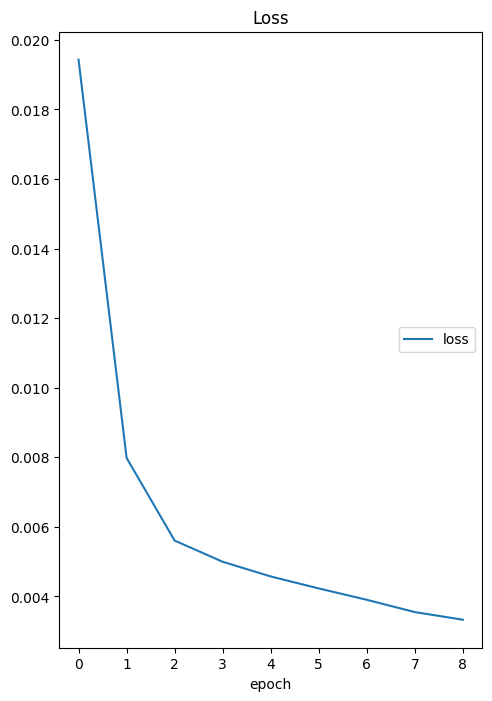

In [24]:
import torch
import torch.nn as nn
import torch.optim as optim
from livelossplot import PlotLosses  # Import live loss plotting library

# Define the LSTM model
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=2):
        super(LSTMModel, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers

        # LSTM layer
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True, bidirectional=True)

        # Fully connected layer to map LSTM output to the desired output size
        self.fc = nn.Linear(hidden_size * 2, output_size)

    def forward(self, x):
        # Initialize hidden and cell states with zeros
        h0 = torch.zeros(self.num_layers * 2, x.size(0), self.hidden_size).to(x.device)  # Hidden state
        c0 = torch.zeros(self.num_layers * 2, x.size(0), self.hidden_size).to(x.device)  # Cell state

        # Forward propagate through LSTM
        out, _ = self.lstm(x, (h0, c0))  # out: tensor of shape (batch_size, seq_length, hidden_size)

        # Map the LSTM output to the desired output size
        out = self.fc(out)  # out: tensor of shape (batch_size, seq_length, output_size)
        return out


# Initialize model, loss function, and optimizer
input_size = len(columns)  # Number of input features (e.g., weather variables)
hidden_size = 128  # Size of the LSTM's hidden state
output_size = len(columns)  # Output size matches input size for reconstruction
num_layers = 5  # Number of LSTM layers

model = LSTMModel(input_size, hidden_size, output_size, num_layers)
criterion = nn.MSELoss()  # Reconstruction loss
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Initialize the live loss plot
liveloss = PlotLosses()

# Training parameters
num_epochs = 30
loss_history = []  # For storing epoch losses

# Training loop
for epoch in range(num_epochs):
    print(f"Epoch {epoch + 1}/{num_epochs}")
    epoch_loss = 0.0

    for dataloader_idx, dataloader in enumerate(dataloaders):
        for corrupted_batch, uncorrupted_batch in dataloader:
            # Add sequence dimension (LSTM expects (batch_size, seq_length, input_size))
            corrupted_batch = corrupted_batch.unsqueeze(1)  # Add seq_length dimension
            uncorrupted_batch = uncorrupted_batch.unsqueeze(1)

            # Replace NaN values in corrupted batch
            corrupted_batch = torch.nan_to_num(corrupted_batch, nan=0)

            # Forward pass
            outputs = model(corrupted_batch)

            # Compute loss
            loss = criterion(outputs, uncorrupted_batch)

            # Backward pass and optimization
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Accumulate loss
            epoch_loss += loss.item()

    # Average loss for the epoch
    epoch_loss /= sum(len(dataloader.dataset) for dataloader in dataloaders)
    loss_history.append(epoch_loss)

    # Update live loss plot after every epoch
    liveloss.update({"loss": epoch_loss})
    liveloss.send()

    print(f"Epoch {epoch + 1} Loss: {epoch_loss}")


And also plot fitted variables onto the target:

<br>

---

<br>

In [22]:
import matplotlib.pyplot as plt

def plot_predictions(model, dataloaders, num_samples=1):
    """
    Applies the trained model to the corrupted training set and plots predictions vs. targets.

    Parameters:
    - model: The trained LSTM model
    - dataloaders: The training dataloaders containing corrupted and uncorrupted data
    - num_samples: Number of samples to plot
    """
    model.eval()  # Set the model to evaluation mode
    all_predictions = []
    all_true_values = []

    with torch.no_grad():  # Disable gradient computation for inference
        for corrupted_batch, uncorrupted_batch in dataloaders[0]:  # Use the first dataloader (corrupted data)
            corrupted_batch = corrupted_batch.unsqueeze(1)  # Add seq_length dimension
            uncorrupted_batch = uncorrupted_batch.unsqueeze(1)

            # Replace NaN values in corrupted batch
            corrupted_batch = torch.nan_to_num(corrupted_batch, nan=-10.0)

            # Forward pass to get predictions
            outputs = model(corrupted_batch)
            # Store predictions and true values
            all_predictions.append(outputs.squeeze(1).cpu().numpy())  # Remove the sequence dimension
            all_true_values.append(uncorrupted_batch.squeeze(1).cpu().numpy())  # True values

    # Convert predictions and true values to numpy arrays for plotting
    all_predictions = torch.cat([torch.tensor(pred) for pred in all_predictions], dim=0).numpy()
    all_true_values = torch.cat([torch.tensor(true) for true in all_true_values], dim=0).numpy()

    # Plotting predictions vs. true values
    num_variables_to_plot = min(5, all_predictions.shape[1])  # Plot up to 5 variables
    sample_indices = range(100)  # Plot the first 100 samples

    for i in range(num_variables_to_plot):
        plt.figure(figsize=(12, 6))
        plt.plot(sample_indices, all_true_values[sample_indices, i], label="True Data", linestyle="dashed")
        plt.plot(sample_indices, all_predictions[sample_indices, i], label="Predicted Data")
        plt.title(f"Variable {i + 1}: True vs. Predicted")
        plt.xlabel("Sample Index")
        plt.ylabel(f"Variable {i + 1} Value")
        plt.legend()
        plt.grid()
        plt.show()


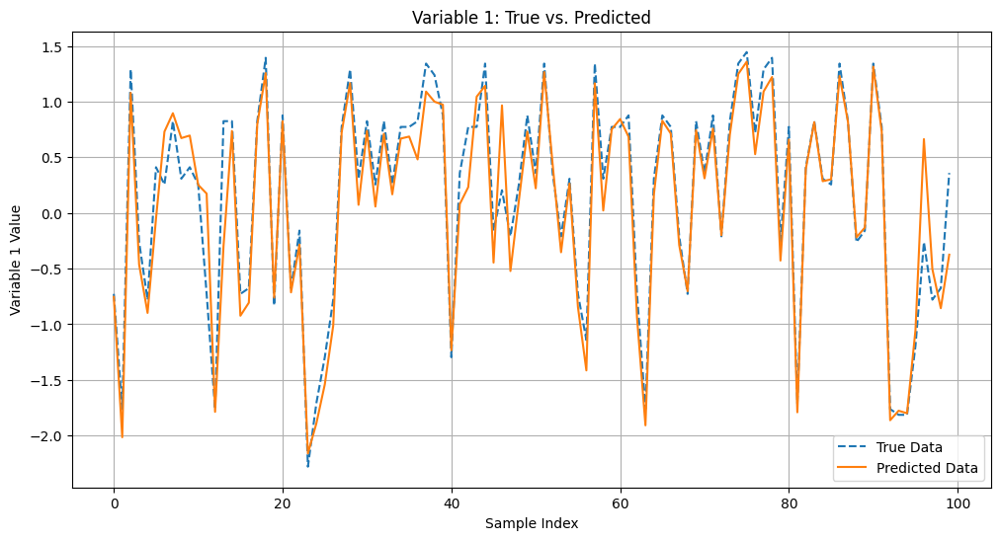

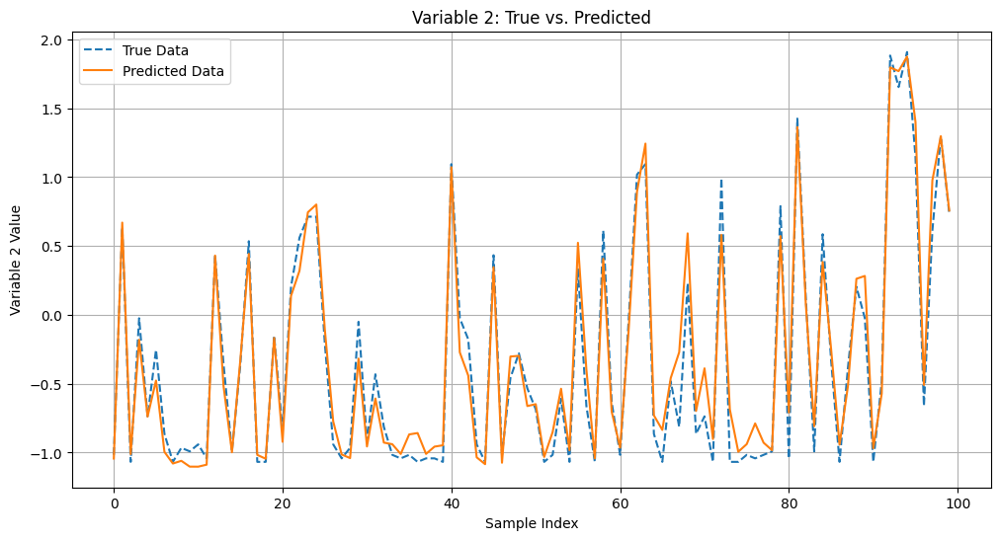

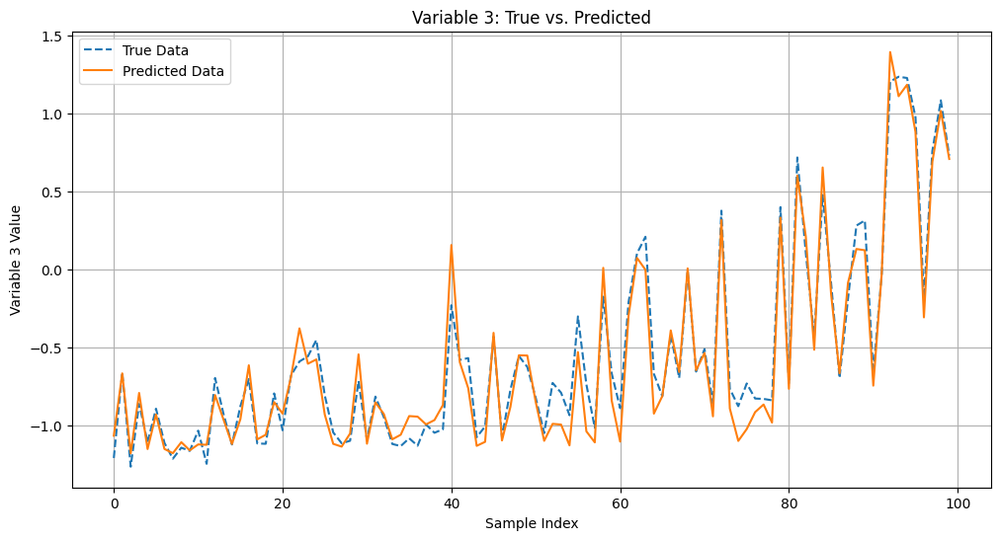

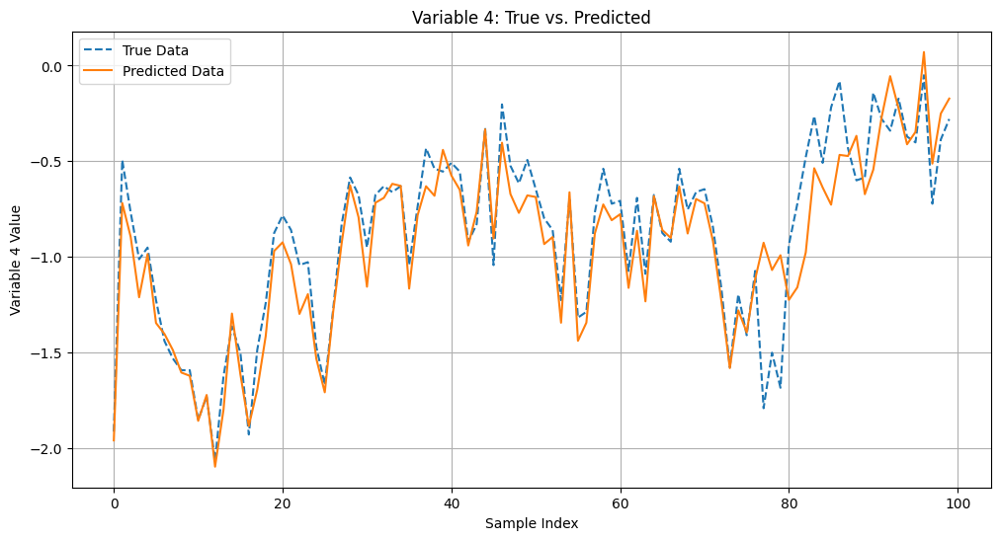

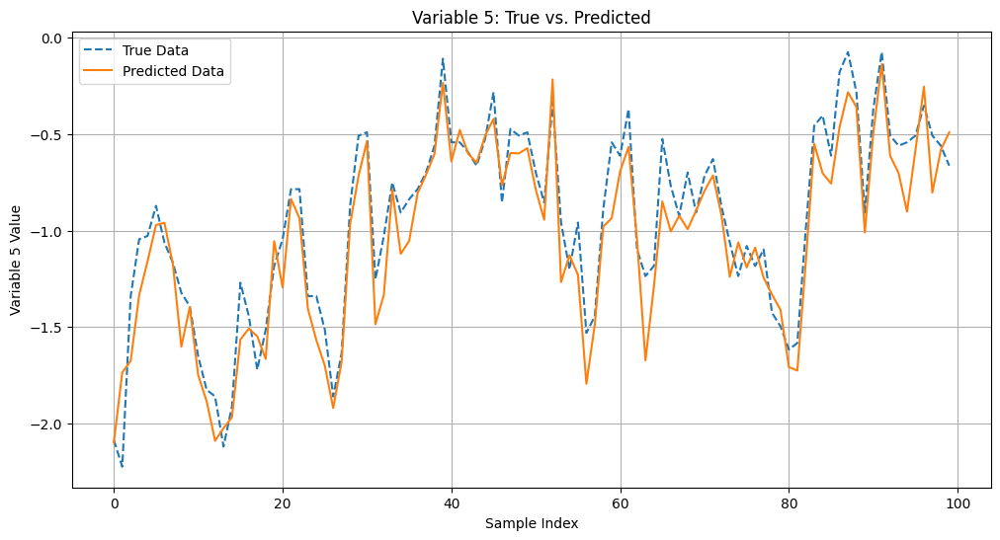

In [23]:
# Assuming `dataloaders` is already defined
plot_predictions(model, dataloaders, num_samples=5)  # Adjust `num_samples` as needed



As it is shown above, the network does not know that it only has to impute the missing values, instead it is attempting to fit the entire data into the target, which is not efficient for the task that we have.

Therefore, we will create a mask for the data, only allowing the data to edit the missing values:

In [51]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from livelossplot import PlotLosses  # Import livelossplot library
from torch.nn import ReLU, LeakyReLU, Tanh, Softplus, GELU

# Define the LSTM model with masking
class LSTMModelWithMasking(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=1):
        super(LSTMModelWithMasking, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers

        # LSTM layer
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True, dropout = 0.3, bidirectional=True)

        # Fully connected layer to map LSTM output to the desired output size
        self.fc = nn.Linear(hidden_size * 2, output_size)

    def forward(self, x, mask):
        """
        Forward pass for the model, applying the mask to ensure only missing values are updated.

        Parameters:
        - x: Input data tensor (batch_size, seq_length, input_size)
        - mask: A mask tensor (batch_size, seq_length) indicating missing values (True for missing, False for valid)

        Returns:
        - out: The model's output, which is the predicted values for missing entries
        """
        # Initialize hidden and cell states with zeros
        h0 = torch.zeros(self.num_layers * 2, x.size(0), self.hidden_size).to(x.device)  # Hidden state for both directions
        c0 = torch.zeros(self.num_layers * 2, x.size(0), self.hidden_size).to(x.device)  # Cell state for both directions

        # Forward propagate through LSTM (bidirectional)
        out, _ = self.lstm(x, (h0, c0))  # out: (batch_size, seq_length, hidden_size * 2)

        # Map the LSTM output to the desired output size
        out = self.fc(out) # out: (batch_size, seq_length, output_size)

        # Apply the mask: only update the missing values, leave valid values unchanged
        out = out * mask.float() + x * (1 - mask.float())  # Replace only missing values with predictions

        return out


# Function to create a mask for missing values
def create_mask(data, mask_value=-10.0):
    """
    Creates a mask where True corresponds to corrupted (missing) data (e.g., NaN or -10),
    and False corresponds to valid (non-missing) data.

    Parameters:
    - data: The input data tensor
    - mask_value: The value indicating corrupted/missing data (default is -10.0)

    Returns:
    - mask: A tensor of the same shape as the input, with True for missing data and False for valid data
    """
    return torch.isnan(data) | (data == mask_value)  # Mask corrupted data (NaN or -10.0)


# Function to train the model with masking
def train_model_with_masking(model, dataloaders, criterion, optimizer, num_epochs=10):
    """
    Train the model on the corrupted training set with masking to predict missing values.

    Parameters:
    - model: The LSTM model to train
    - dataloaders: The DataLoader containing the corrupted and uncorrupted data
    - criterion: The loss function (e.g., MSELoss)
    - optimizer: The optimizer used for training
    - num_epochs: The number of epochs for training

    Returns:
    - The trained model
    """
    liveloss = PlotLosses()  # Initialize live loss plot
    for epoch in range(num_epochs):
        print(f"Epoch {epoch + 1}/{num_epochs}")
        epoch_loss = 0.0

        for dataloader_idx, dataloader in enumerate(dataloaders):
            for corrupted_batch, uncorrupted_batch in dataloader:
                # Add sequence dimension (LSTM expects (batch_size, seq_length, input_size))
                corrupted_batch = corrupted_batch.unsqueeze(1)  # Add seq_length dimension
                uncorrupted_batch = uncorrupted_batch.unsqueeze(1)

                # Create the mask for missing values (e.g., NaN or 0 for corrupted data)
                mask = create_mask(corrupted_batch, mask_value=0.0)

                # Replace NaN values in corrupted batch with a specific value, like 0
                corrupted_batch = torch.nan_to_num(corrupted_batch, nan=0.0)

                # Forward pass with the mask
                outputs = model(corrupted_batch, mask)

                # Compute the loss only on the missing values (where the mask is True)
                loss = criterion(outputs * mask.float(), uncorrupted_batch * mask.float())

                # Backward pass and optimization
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                # Accumulate loss
                epoch_loss += loss.item()

        # Average loss for the epoch
        epoch_loss /= sum(len(dataloader.dataset) for dataloader in dataloaders)

        # Update live plot
        liveloss.update({"loss": epoch_loss})
        liveloss.send()

        print(f"Epoch {epoch + 1} Loss: {epoch_loss}")

    return model # Return the trained model

def plot_predictions(model, dataloaders, num_samples=1):
    """
    Applies the trained model to the corrupted training set and plots predictions vs. targets.

    Parameters:
    - model: The trained LSTM model
    - dataloaders: The training dataloaders containing corrupted and uncorrupted data
    - num_samples: Number of samples to plot
    """
    model.eval()  # Set the model to evaluation mode
    all_predictions = []
    all_true_values = []

    # List to store the outputs of all dataloaders
    all_dataloader_predictions = []
    all_dataloader_true_values = []

    with torch.no_grad():  # Disable gradient computation for inference
        for dataloader_idx, dataloader in enumerate(dataloaders):
            dataloader_predictions = []
            dataloader_true_values = []

            for corrupted_batch, uncorrupted_batch in dataloader:
                corrupted_batch = corrupted_batch.unsqueeze(1)  # Add seq_length dimension
                uncorrupted_batch = uncorrupted_batch.unsqueeze(1)

                # Replace NaN values in corrupted batch
                corrupted_batch = torch.nan_to_num(corrupted_batch, nan=0)

                # Forward pass to get predictions
                outputs = model(corrupted_batch, create_mask(corrupted_batch, mask_value=0))

                # Store predictions and true values
                dataloader_predictions.append(outputs.squeeze(1).cpu().numpy())  # Remove the sequence dimension
                dataloader_true_values.append(uncorrupted_batch.squeeze(1).cpu().numpy())  # True values

            # Collect the predictions and true values for the current dataloader
            all_dataloader_predictions.append(dataloader_predictions)
            all_dataloader_true_values.append(dataloader_true_values)

    # Convert predictions and true values to numpy arrays for plotting
    all_predictions = [torch.cat([torch.tensor(pred) for pred in dataloader_predictions], dim=0).numpy()
                       for dataloader_predictions in all_dataloader_predictions]
    all_true_values = [torch.cat([torch.tensor(true) for true in dataloader_true_values], dim=0).numpy()
                       for dataloader_true_values in all_dataloader_true_values]

    # Plotting predictions vs. true values for all variables
    num_variables_to_plot = min(9, all_predictions[0].shape[1])
    sample_indices = range(100)  # Plot the first 100 samples

    # Plot for each variable
    for var_idx in range(num_variables_to_plot):
        fig, axes = plt.subplots(1, len(dataloaders), figsize=(12 * len(dataloaders), 6))

        for dataloader_idx, ax in enumerate(axes):
            ax.plot(sample_indices, all_true_values[dataloader_idx][sample_indices, var_idx], label="True Data", linestyle="dashed")
            ax.plot(sample_indices, all_predictions[dataloader_idx][sample_indices, var_idx], label="Predicted Data")
            ax.set_title(f"Dataloader {dataloader_idx + 1} - Variable {var_idx + 1}")
            ax.set_xlabel("Sample Index")
            ax.set_ylabel(f"Variable {var_idx + 1} Value")
            ax.legend()
            ax.grid()

        plt.tight_layout()
        plt.show()

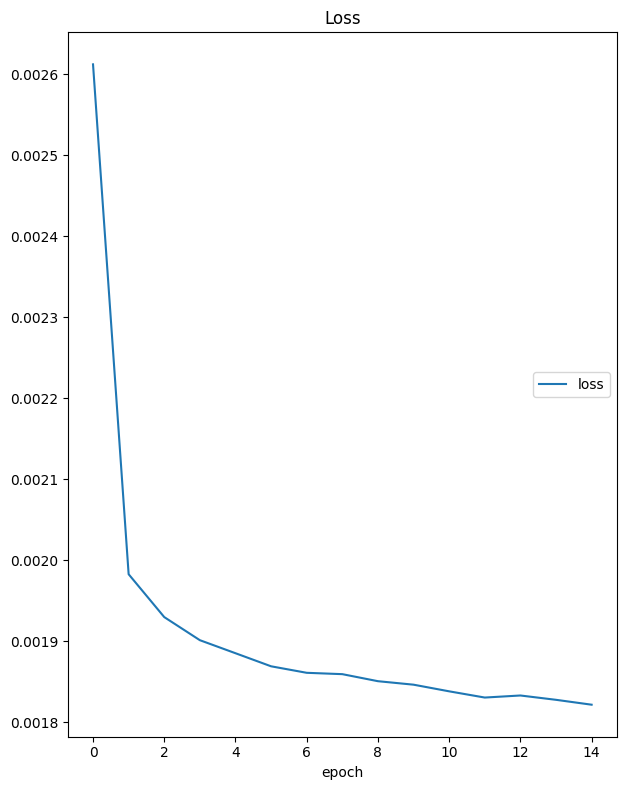

Loss
	loss             	 (min:    0.002, max:    0.003, cur:    0.002)
Epoch 15 Loss: 0.0018216931398782228


In [26]:
# Initialize the model, loss function, and optimizer
input_size = len(columns)  # Number of input features (e.g., weather variables)
hidden_size = 128  # Size of the LSTM's hidden state
output_size = len(columns)  # Output size matches input size for reconstruction
num_layers = 2  # Number of LSTM layers

model = LSTMModelWithMasking(input_size, hidden_size, output_size, num_layers)

# Initialize the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)

# Train the model
model = train_model_with_masking(model, dataloaders, criterion, optimizer, num_epochs=15)

# Plot predictions vs. true values



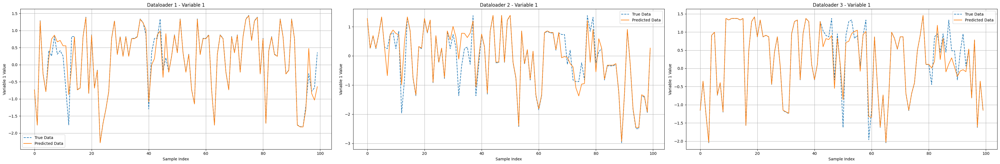

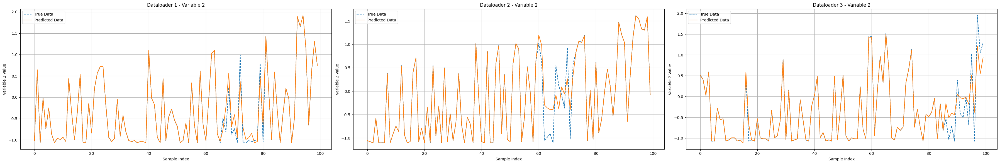

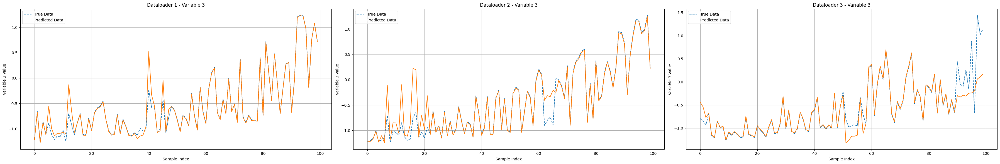

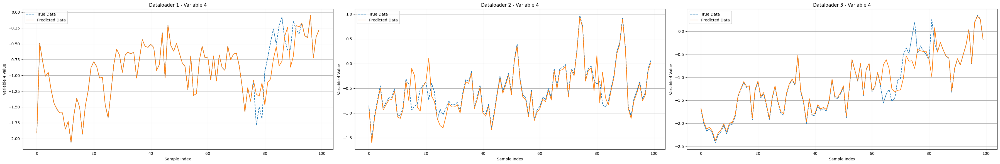

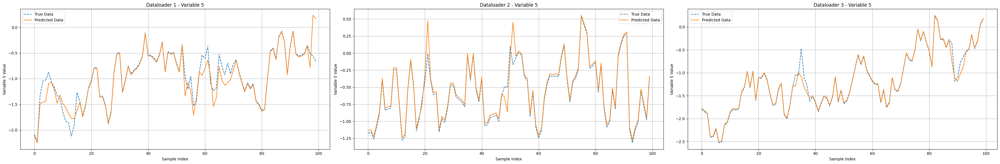

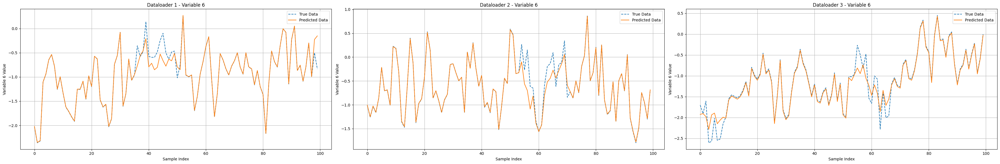

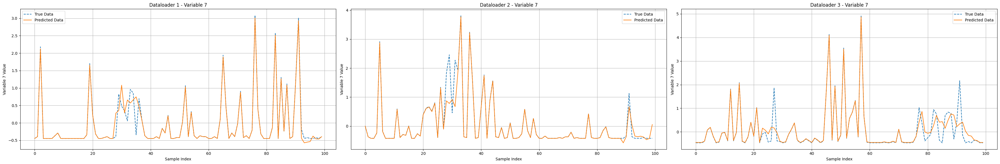

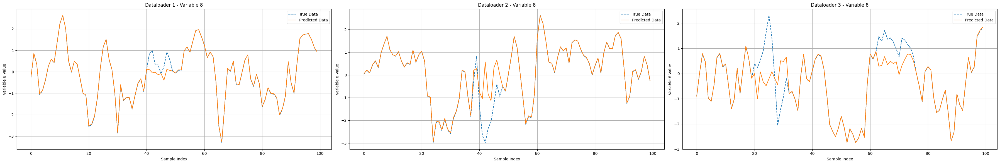

In [27]:
plot_predictions(model, dataloaders, num_samples=9)

# Use training_set_2 as a validation set

In [33]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from livelossplot import PlotLosses  # Import livelossplot library
from torch.nn import ReLU, LeakyReLU, Tanh, Softplus, GELU
import numpy as np

# Define the LSTM model with masking
class LSTMModelWithMasking(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=1, dropout=0.3):
        super(LSTMModelWithMasking, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers

        # LSTM layer with dynamic dropout
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True, dropout=dropout, bidirectional=True)

        # Fully connected layer
        self.fc = nn.Linear(hidden_size * 2, output_size)

    def forward(self, x, mask):
        h0 = torch.zeros(self.num_layers * 2, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers * 2, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out)
        out = out * mask.float() + x * (1 - mask.float())
        return out

# Function to create a mask for missing values
def create_mask(data, mask_value=-10.0):
    """
    Creates a mask where True corresponds to corrupted (missing) data (e.g., NaN or -10),
    and False corresponds to valid (non-missing) data.

    Parameters:
    - data: The input data tensor
    - mask_value: The value indicating corrupted/missing data (default is -10.0)

    Returns:
    - mask: A tensor of the same shape as the input, with True for missing data and False for valid data
    """
    return torch.isnan(data) | (data == mask_value)  # Mask corrupted data (NaN or mask_value)

# Function to train the model with masking and include validation loss
def train_model_with_masking(model, train_dataloaders, val_dataloader, criterion, optimizer, num_epochs=10):
    """
    Train the model on the corrupted training set with masking to predict missing values.
    Also evaluates on the validation set and updates live plots with both training and validation losses.

    Parameters:
    - model: The LSTM model to train
    - train_dataloaders: A list of DataLoaders for training
    - val_dataloader: DataLoader for validation
    - criterion: The loss function (e.g., MSELoss)
    - optimizer: The optimizer used for training
    - num_epochs: The number of epochs for training

    Returns:
    - The trained model
    """
    liveloss = PlotLosses()  # Initialize live loss plot
    for epoch in range(num_epochs):
        print(f"Epoch {epoch + 1}/{num_epochs}")
        model.train()  # Set model to training mode
        train_loss = 0.0
        train_samples = 0

        # Training Phase
        for dataloader_idx, dataloader in enumerate(train_dataloaders):
            for corrupted_batch, uncorrupted_batch in dataloader:
                # Add sequence dimension (LSTM expects (batch_size, seq_length, input_size))
                corrupted_batch = corrupted_batch.unsqueeze(1).to(model.fc.weight.device)  # Add seq_length dimension and move to device
                uncorrupted_batch = uncorrupted_batch.unsqueeze(1).to(model.fc.weight.device)

                # Create the mask for missing values (e.g., NaN or mask_value)
                mask = create_mask(corrupted_batch, mask_value=0.0)

                # Replace NaN values in corrupted batch with a specific value, like 0
                corrupted_batch = torch.nan_to_num(corrupted_batch, nan=0.0)

                # Forward pass with the mask
                outputs = model(corrupted_batch, mask)

                # Compute the loss only on the missing values (where the mask is True)
                loss = criterion(outputs * mask.float(), uncorrupted_batch * mask.float())

                # Backward pass and optimization
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                # Accumulate loss
                train_loss += loss.item() * corrupted_batch.size(0)
                train_samples += corrupted_batch.size(0)

        # Calculate average training loss
        avg_train_loss = train_loss / train_samples

        # Validation Phase
        model.eval()  # Set model to evaluation mode
        val_loss = 0.0
        val_samples = 0
        with torch.no_grad():  # Disable gradient computation for inference
            for corrupted_batch, uncorrupted_batch in val_dataloader:
                corrupted_batch = corrupted_batch.unsqueeze(1).to(model.fc.weight.device)  # Add seq_length dimension and move to device
                uncorrupted_batch = uncorrupted_batch.unsqueeze(1).to(model.fc.weight.device)

                # Create the mask for missing values
                mask = create_mask(corrupted_batch, mask_value=0.0)

                # Replace NaN values in corrupted batch with a specific value, like 0
                corrupted_batch = torch.nan_to_num(corrupted_batch, nan=0.0)

                # Forward pass with the mask
                outputs = model(corrupted_batch, mask)
                loss = criterion(outputs * mask.float(), uncorrupted_batch * mask.float())
                val_loss += loss.item() * corrupted_batch.size(0)
                val_samples += corrupted_batch.size(0)

        # Calculate average validation loss
        avg_val_loss = val_loss / val_samples

        # Update live plot with both training and validation losses
        liveloss.update({
            "Training Loss": avg_train_loss,
            "Validation Loss": avg_val_loss
        })
        liveloss.send()

        print(f"Epoch {epoch + 1} - Training Loss: {avg_train_loss:.6f}, Validation Loss: {avg_val_loss:.6f}")

    return model  # Return the trained model

def plot_predictions(model, dataloaders, num_samples):
    """
    Applies the trained model to the corrupted training set and plots predictions vs. targets.

    Parameters:
    - model: The trained LSTM model
    - dataloaders: The training dataloaders containing corrupted and uncorrupted data
    - num_samples: Number of samples to plot per variable
    """
    model.eval()  # Set the model to evaluation mode
    all_predictions = []
    all_true_values = []

    with torch.no_grad():  # Disable gradient computation for inference
        for dataloader_idx, dataloader in enumerate(dataloaders):
            dataloader_predictions = []
            dataloader_true_values = []

            for batch_idx, (corrupted_batch, uncorrupted_batch) in enumerate(dataloader):
                # Add sequence dimension (LSTM expects (batch_size, seq_length, input_size))
                corrupted_batch = corrupted_batch.unsqueeze(1).to(model.fc.weight.device)  # Shape: (batch_size, 1, input_size)
                uncorrupted_batch = uncorrupted_batch.unsqueeze(1).to(model.fc.weight.device)  # Shape: (batch_size, 1, input_size)

                # Replace NaN values in corrupted batch with a specific value, like 0
                corrupted_batch = torch.nan_to_num(corrupted_batch, nan=0.0)

                # Create the mask for missing values
                mask = create_mask(corrupted_batch, mask_value=0.0)  # Shape: (batch_size, 1, input_size)

                # Forward pass to get predictions
                outputs = model(corrupted_batch, mask)  # Shape: (batch_size, 1, output_size)

                # Squeeze the sequence dimension and move to CPU
                predictions = outputs.squeeze(1).cpu().numpy()  # Shape: (batch_size, output_size)
                true_values = uncorrupted_batch.squeeze(1).cpu().numpy()  # Shape: (batch_size, output_size)


                dataloader_predictions.append(predictions)
                dataloader_true_values.append(true_values)

            # Concatenate all batches for the current dataloader using NumPy
            try:
                concatenated_predictions = np.concatenate(dataloader_predictions, axis=0)
                concatenated_true_values = np.concatenate(dataloader_true_values, axis=0)
            except ValueError as e:
                print(f"Error concatenating predictions for Dataloader {dataloader_idx + 1}: {e}")
                continue  # Skip this dataloader if concatenation fails

            all_predictions.append(concatenated_predictions)
            all_true_values.append(concatenated_true_values)

    # Ensure there is at least one set of predictions
    if not all_predictions:
        print("No predictions to plot. Exiting function.")
        return

    # Plotting predictions vs. true values for all variables
    num_variables_to_plot = min(9, all_predictions[0].shape[1])  # Plot up to 9 variables
    sample_indices = range(min(num_samples, all_predictions[0].shape[0]))  # Adjust based on available samples

    # Plot for each variable
    for var_idx in range(num_variables_to_plot):
        fig, axes = plt.subplots(1, len(dataloaders), figsize=(6 * len(dataloaders), 4), sharey=True)

        for dataloader_idx, ax in enumerate(axes):
            if dataloader_idx >= len(all_predictions):
                ax.axis('off')  # Hide unused subplots
                continue

            # Ensure we don't exceed the available samples
            current_sample_indices = list(sample_indices)
            if len(current_sample_indices) > all_predictions[dataloader_idx].shape[0]:
                current_sample_indices = list(range(all_predictions[dataloader_idx].shape[0]))

            # Extract data for plotting
            true_data = all_true_values[dataloader_idx][current_sample_indices, var_idx]
            predicted_data = all_predictions[dataloader_idx][current_sample_indices, var_idx]

            ax.plot(current_sample_indices, true_data, label="True Data", linestyle="dashed")
            ax.plot(current_sample_indices, predicted_data, label="Predicted Data")
            ax.set_title(f"Dataloader {dataloader_idx + 1} - Variable {var_idx + 1}")
            ax.set_xlabel("Sample Index")
            if dataloader_idx == 0:
                ax.set_ylabel(f"Variable {var_idx + 1} Value")
            ax.legend()
            ax.grid()

        plt.tight_layout()
        plt.show()


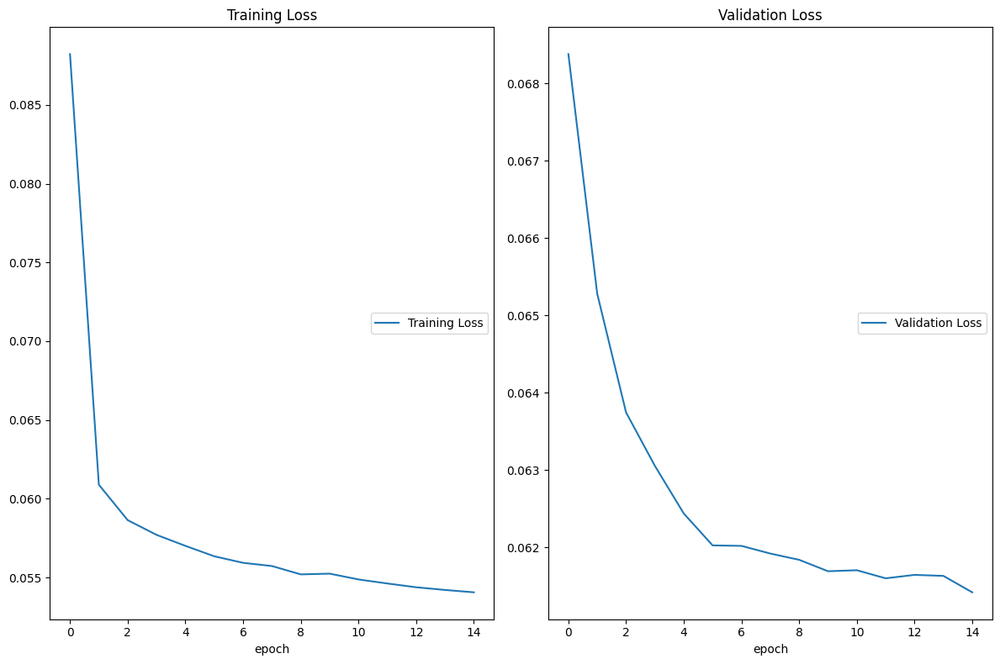

Training Loss
	Training Loss    	 (min:    0.054, max:    0.088, cur:    0.054)
Validation Loss
	Validation Loss  	 (min:    0.061, max:    0.068, cur:    0.061)
Epoch 15 - Training Loss: 0.054056, Validation Loss: 0.061421


In [29]:
# Initialize the model, loss function, and optimizer
input_size = len(columns)  # Number of input features (e.g., weather variables)
hidden_size = 128  # Size of the LSTM's hidden state
output_size = len(columns)  # Output size matches input size for reconstruction
num_layers = 2  # Number of LSTM layers

model = LSTMModelWithMasking(input_size, hidden_size, output_size, num_layers)

# Move the model to the appropriate device (GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Initialize the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

# Split the dataloaders: first two for training, last one for validation
train_dataloaders = dataloaders[:2]
val_dataloader = dataloaders[2]

# Train the model with masking and validation
model = train_model_with_masking(model, train_dataloaders, val_dataloader, criterion, optimizer, num_epochs=15)




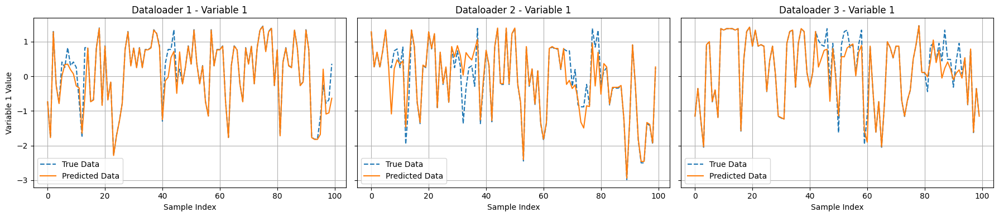

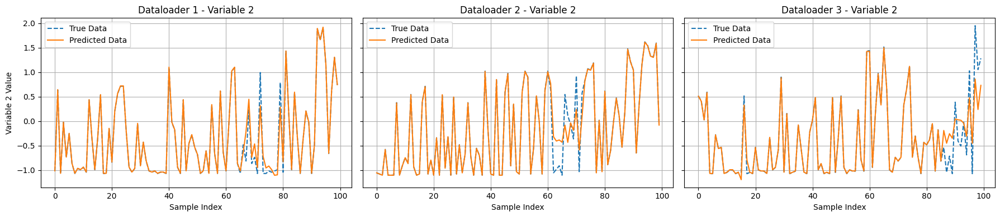

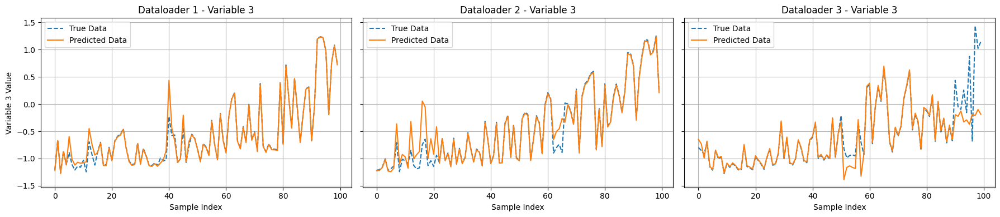

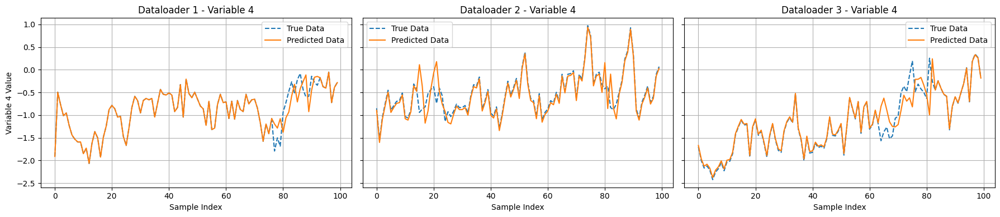

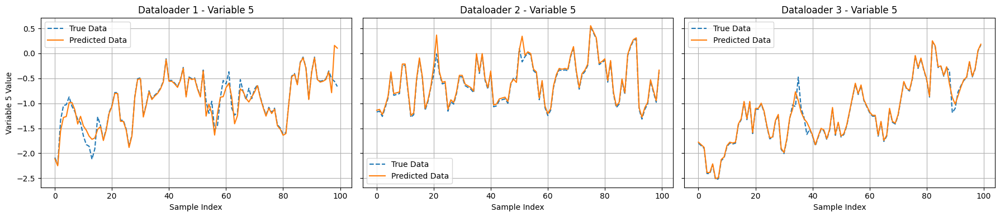

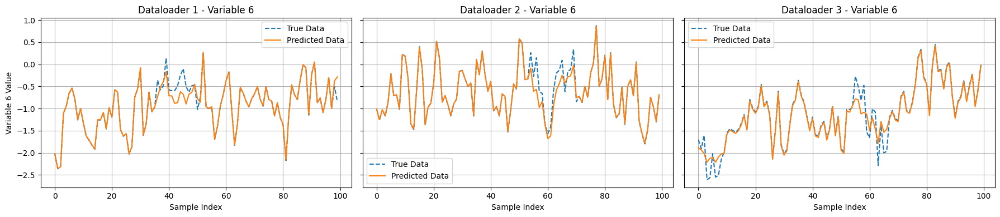

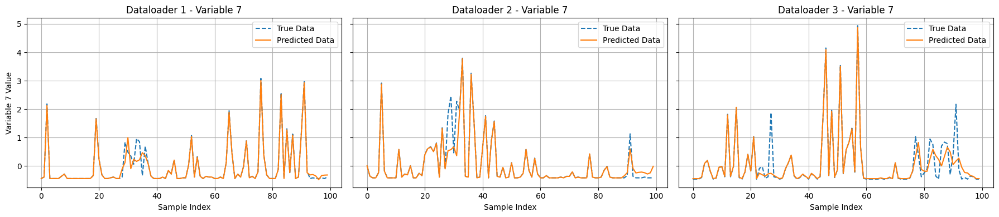

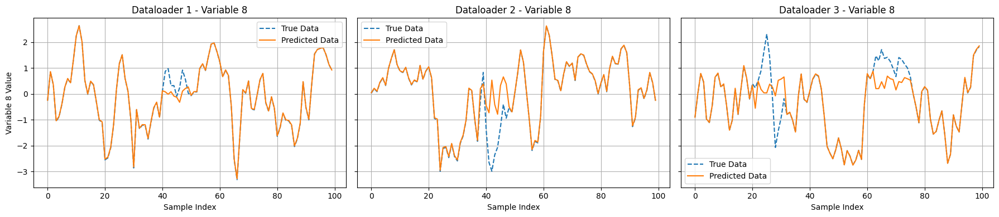

In [30]:
# After training, plot predictions for the first 100 data points in each DataLoader
plot_predictions(model.to('cpu'), train_dataloaders + [val_dataloader], num_samples=100)

# Random search with 2 T 1 V

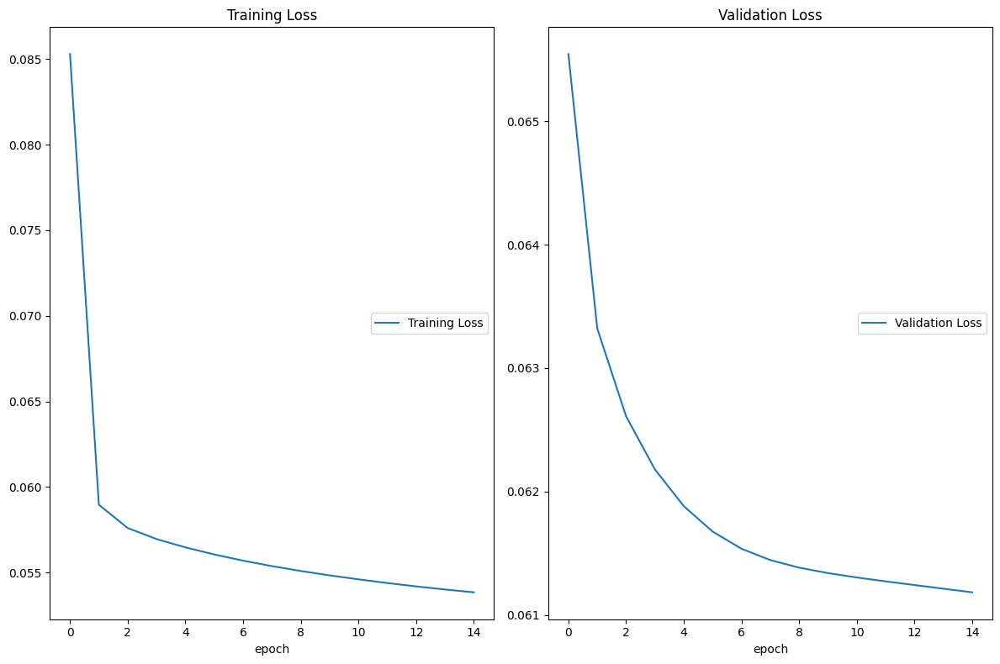

Training Loss
	Training Loss    	 (min:    0.054, max:    0.085, cur:    0.054)
Validation Loss
	Validation Loss  	 (min:    0.061, max:    0.066, cur:    0.061)
Epoch 15 - Training Loss: 0.053842, Validation Loss: 0.061183
{'hidden_size': 256, 'num_layers': 1, 'learning_rate': 0.001, 'weight_decay': 1e-05, 'dropout': 0.1}


In [54]:
import random
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np

# Assume we have the following variables and functions defined:
# - columns: a list of the input features used in the model
# - dataloaders: a list of training/validation dataloaders
# - LSTMModelWithMasking: the model class defined above (with dropout parameter)
# - create_mask, train_model_with_masking, plot_predictions: functions defined above

# Hyperparameter search space
param_distributions = {
    'hidden_size': [64, 128, 256],
    'num_layers': [1, 2, 4],
    'learning_rate': [0.001, 0.0001, 0.00001],
    'weight_decay': [1e-5, 1e-6, 0.0],
    'dropout': [0.0, 0.1, 0.3]
}

def random_search(num_iterations=5, num_epochs=15):
    """
    Perform a random search for the best hyperparameters by randomly sampling
    from predefined distributions.

    Parameters:
    - num_iterations: How many random samples of hyperparameters to try
    - num_epochs: Number of epochs to train for each hyperparameter set

    Returns:
    - best_params: Dictionary of the best found hyperparameters
    - best_val_loss: The validation loss corresponding to the best hyperparameters
    """
    best_val_loss = float('inf')
    best_params = None

    # Split the dataloaders (assuming last one is validation)
    train_dataloaders = dataloaders[:2]
    val_dataloader = dataloaders[2]

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    for iteration in range(num_iterations):
        # Randomly sample hyperparameters
        sampled_params = {
            'hidden_size': random.choice(param_distributions['hidden_size']),
            'num_layers': random.choice(param_distributions['num_layers']),
            'learning_rate': random.choice(param_distributions['learning_rate']),
            'weight_decay': random.choice(param_distributions['weight_decay']),
            'dropout': random.choice(param_distributions['dropout'])
        }

        print(f"\nRandom Search Iteration {iteration+1}/{num_iterations}")
        print("Sampled hyperparameters:", sampled_params)

        # Initialize model with sampled hyperparameters
        input_size = len(columns)
        output_size = len(columns)
        model = LSTMModelWithMasking(
            input_size,
            sampled_params['hidden_size'],
            output_size,
            num_layers=sampled_params['num_layers'],
            dropout=sampled_params['dropout']
        )

        model.to(device)

        # Initialize criterion and optimizer
        criterion = nn.MSELoss()
        optimizer = optim.Adam(model.parameters(), lr=sampled_params['learning_rate'], weight_decay=sampled_params['weight_decay'])

        # Train the model
        trained_model = train_model_with_masking(model,
                                                 train_dataloaders,
                                                 val_dataloader,
                                                 criterion,
                                                 optimizer,
                                                 num_epochs=num_epochs)

        # Evaluate on the validation set
        trained_model.eval()
        val_loss = 0.0
        val_samples = 0
        with torch.no_grad():
            for corrupted_batch, uncorrupted_batch in val_dataloader:
                corrupted_batch = corrupted_batch.unsqueeze(1).to(device)  # Add sequence dimension
                uncorrupted_batch = uncorrupted_batch.unsqueeze(1).to(device)

                mask = create_mask(corrupted_batch, mask_value=0.0)
                corrupted_batch = torch.nan_to_num(corrupted_batch, nan=0.0)

                outputs = trained_model(corrupted_batch, mask)
                loss = criterion(outputs * mask.float(), uncorrupted_batch * mask.float())
                val_loss += loss.item() * corrupted_batch.size(0)
                val_samples += corrupted_batch.size(0)

        avg_val_loss = val_loss / val_samples
        print(f"Validation Loss for this config: {avg_val_loss:.6f}")

        # Check if this is the best so far
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            best_params = sampled_params

    print("\nBest Hyperparameters found:")
    print(best_params)
    print("With Validation Loss:", best_val_loss)

    return best_params, best_val_loss


# Example usage:
best_params, best_val_loss = random_search(num_iterations=10, num_epochs=15)

# After identifying the best parameters, you can retrain the model with them and then plot predictions:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

best_model = LSTMModelWithMasking(
    input_size=len(columns),
    hidden_size=best_params['hidden_size'],
    output_size=len(columns),
    num_layers=best_params['num_layers'],
    dropout=best_params['dropout']
)

best_model.to(device)

optimizer = optim.Adam(best_model.parameters(), lr=best_params['learning_rate'], weight_decay=best_params['weight_decay'])
criterion = nn.MSELoss()

train_dataloaders = dataloaders[:2]
val_dataloader = dataloaders[2]

best_model = train_model_with_masking(best_model, train_dataloaders, val_dataloader, criterion, optimizer, num_epochs=15)

print(best_params)



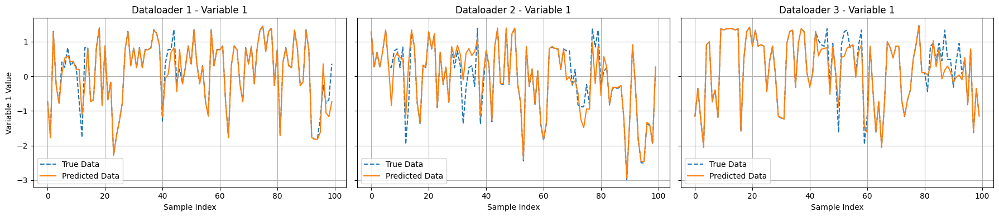

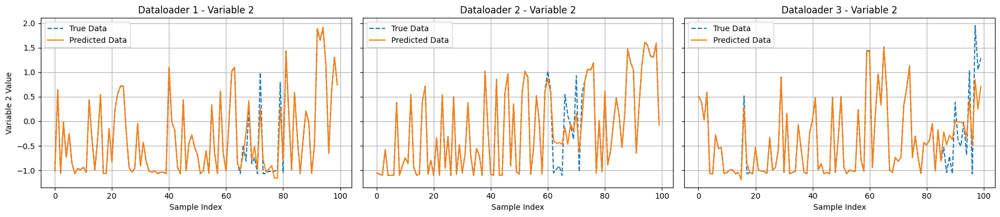

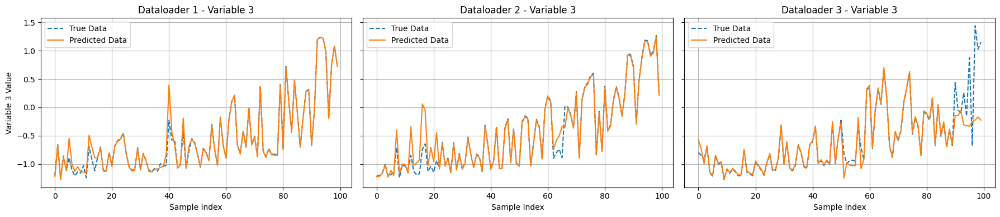

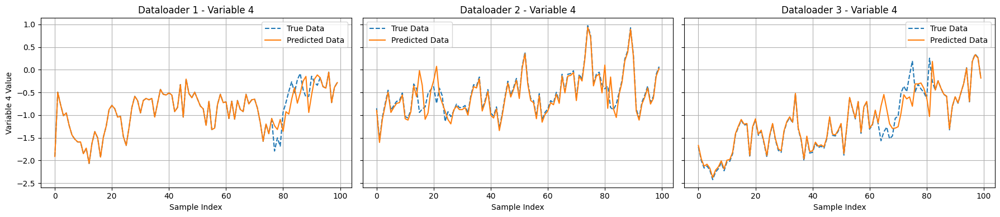

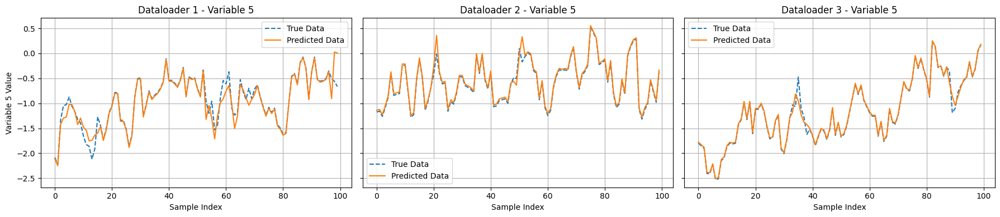

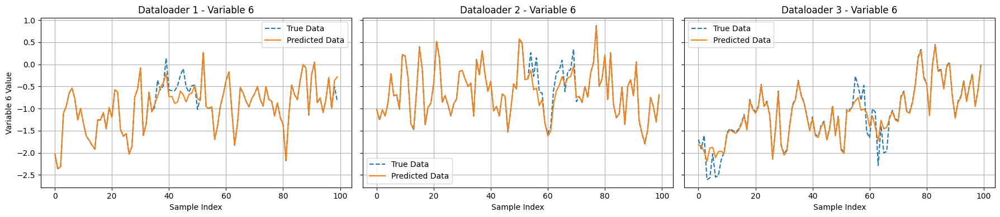

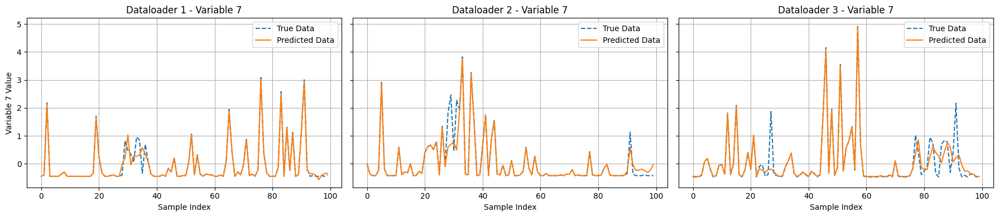

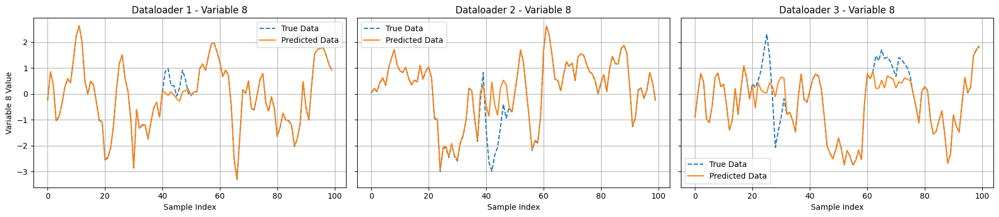

In [32]:
plot_predictions(best_model, dataloaders[:3], num_samples=100)

# Transformer with 2t 1v

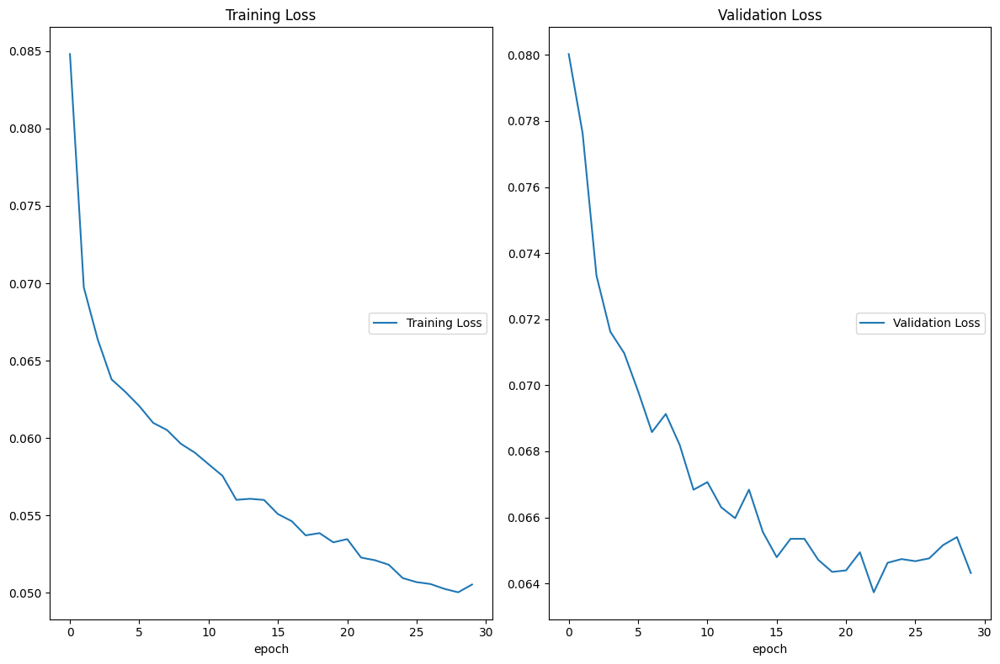

Training Loss
	Training Loss    	 (min:    0.050, max:    0.085, cur:    0.051)
Validation Loss
	Validation Loss  	 (min:    0.064, max:    0.080, cur:    0.064)
Epoch 30 - Training Loss: 0.050544, Validation Loss: 0.064316


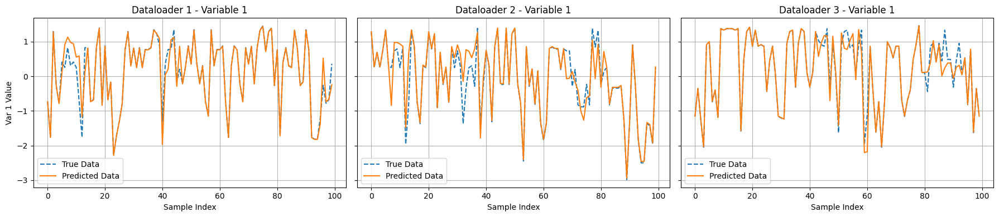

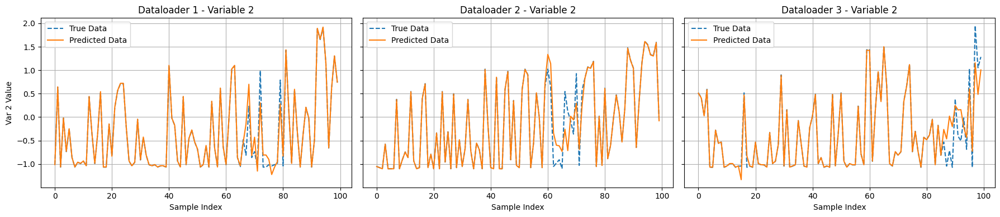

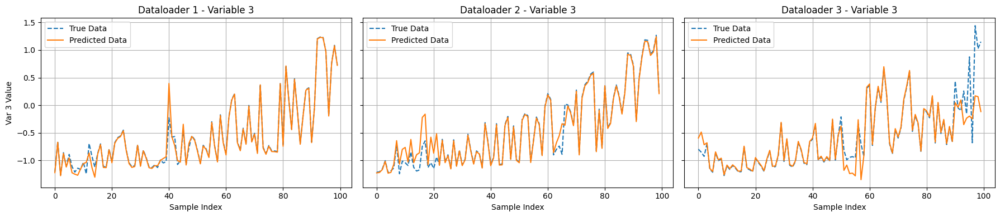

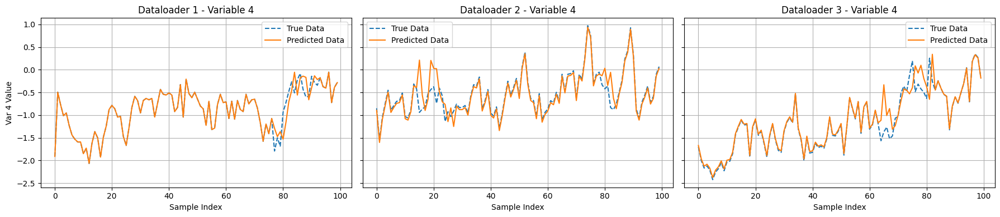

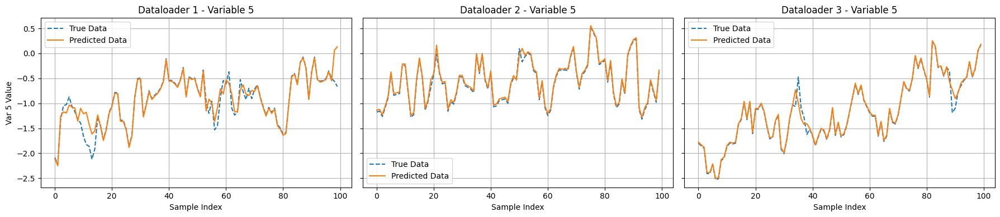

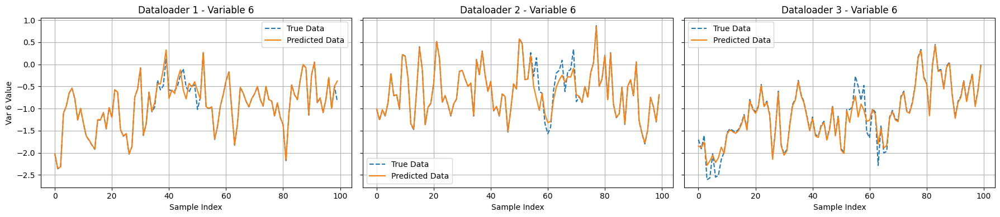

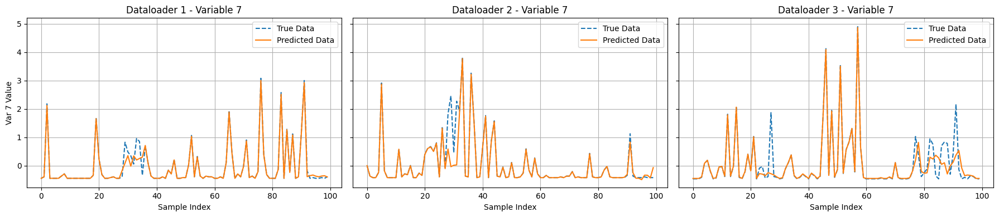

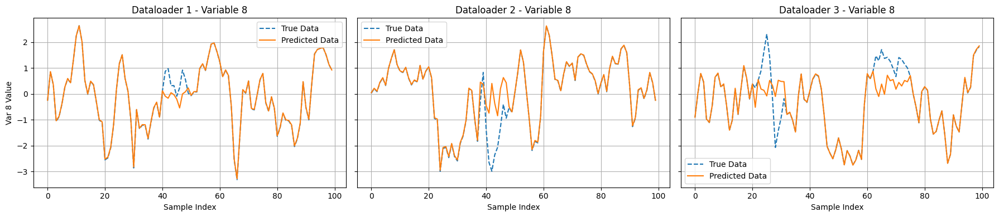

In [57]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from livelossplot import PlotLosses
import numpy as np

# Example variable definitions (you must provide these)
# columns = [...]  # list of feature names
# dataloaders = [train_dataloader_1, train_dataloader_2, val_dataloader] # prepared DataLoaders

class TransformerModelWithMasking(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=2, n_heads=4, dim_feedforward=256, dropout=0.1):
        super(TransformerModelWithMasking, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers

        # Linear layer to embed input features into hidden dimension
        self.input_fc = nn.Linear(input_size, hidden_size)

        # Transformer encoder setup
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=hidden_size,
            nhead=n_heads,
            dim_feedforward=dim_feedforward,
            dropout=dropout,
            batch_first=False
        )
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        # Output layer
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x, mask):
        # x shape: (batch_size, seq_length, input_size)
        batch_size, seq_length, input_size = x.size()
        device = x.device

        # Project inputs to hidden size
        x_emb = self.input_fc(x)  # (batch_size, seq_length, hidden_size)

        # Transformer expects (seq_length, batch_size, hidden_size)
        x_emb = x_emb.permute(1, 0, 2)  # (seq_length, batch_size, hidden_size)

        # Pass through transformer encoder
        out = self.transformer_encoder(x_emb)  # (seq_length, batch_size, hidden_size)

        # Transpose back
        out = out.permute(1, 0, 2)  # (batch_size, seq_length, hidden_size)

        # Final linear layer
        out = self.fc(out)  # (batch_size, seq_length, output_size)

        # Apply mask: only replace missing values
        out = out * mask.float() + x * (1 - mask.float())
        return out

def create_mask(data, mask_value=-10.0):
    """
    Creates a mask where True corresponds to corrupted (missing) data,
    and False corresponds to valid data.
    """
    return torch.isnan(data) | (data == mask_value)

def train_model_with_masking(model, train_dataloaders, val_dataloader, criterion, optimizer, num_epochs=10):
    liveloss = PlotLosses()
    device = next(model.parameters()).device

    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        model.train()
        train_loss = 0.0
        train_samples = 0

        # Training loop
        for dataloader_idx, dataloader in enumerate(train_dataloaders):
            for corrupted_batch, uncorrupted_batch in dataloader:
                corrupted_batch = corrupted_batch.to(device)
                uncorrupted_batch = uncorrupted_batch.to(device)

                # If data is (batch_size, input_size) and we want seq_length=1:
                corrupted_batch = corrupted_batch.unsqueeze(1)    # (batch_size, 1, input_size)
                uncorrupted_batch = uncorrupted_batch.unsqueeze(1)# (batch_size, 1, input_size)

                mask = create_mask(corrupted_batch, mask_value=0.0)
                corrupted_batch = torch.nan_to_num(corrupted_batch, nan=0.0)

                outputs = model(corrupted_batch, mask)

                # Compute loss on missing values only
                loss = criterion(outputs * mask.float(), uncorrupted_batch * mask.float())

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                train_loss += loss.item() * corrupted_batch.size(0)
                train_samples += corrupted_batch.size(0)

        avg_train_loss = train_loss / train_samples

        # Validation loop
        model.eval()
        val_loss = 0.0
        val_samples = 0
        with torch.no_grad():
            for corrupted_batch, uncorrupted_batch in val_dataloader:
                corrupted_batch = corrupted_batch.to(device)
                uncorrupted_batch = uncorrupted_batch.to(device)

                # Add sequence dimension
                corrupted_batch = corrupted_batch.unsqueeze(1)
                uncorrupted_batch = uncorrupted_batch.unsqueeze(1)

                mask = create_mask(corrupted_batch, mask_value=0.0)
                corrupted_batch = torch.nan_to_num(corrupted_batch, nan=0.0)

                outputs = model(corrupted_batch, mask)
                loss = criterion(outputs * mask.float(), uncorrupted_batch * mask.float())
                val_loss += loss.item() * corrupted_batch.size(0)
                val_samples += corrupted_batch.size(0)

        avg_val_loss = val_loss / val_samples

        liveloss.update({
            "Training Loss": avg_train_loss,
            "Validation Loss": avg_val_loss
        })
        liveloss.send()
        print(f"Epoch {epoch+1} - Training Loss: {avg_train_loss:.6f}, Validation Loss: {avg_val_loss:.6f}")

    return model

def plot_predictions(model, dataloaders, num_samples=100):
    model.eval()
    device = next(model.parameters()).device
    all_predictions = []
    all_true_values = []

    with torch.no_grad():
        for dataloader_idx, dataloader in enumerate(dataloaders):
            dataloader_predictions = []
            dataloader_true_values = []

            for batch_idx, (corrupted_batch, uncorrupted_batch) in enumerate(dataloader):
                corrupted_batch = corrupted_batch.to(device)
                uncorrupted_batch = uncorrupted_batch.to(device)

                corrupted_batch = corrupted_batch.unsqueeze(1)    # (batch, 1, input_size)
                uncorrupted_batch = uncorrupted_batch.unsqueeze(1)# (batch, 1, input_size)

                corrupted_batch = torch.nan_to_num(corrupted_batch, nan=0.0)
                mask = create_mask(corrupted_batch, mask_value=0.0)

                outputs = model(corrupted_batch, mask)

                predictions = outputs.cpu().numpy()
                true_vals = uncorrupted_batch.cpu().numpy()

                dataloader_predictions.append(predictions)
                dataloader_true_values.append(true_vals)

            try:
                concatenated_predictions = np.concatenate(dataloader_predictions, axis=0)
                concatenated_true_values = np.concatenate(dataloader_true_values, axis=0)
            except ValueError as e:
                print(f"Error concatenating predictions for Dataloader {dataloader_idx + 1}: {e}")
                continue

            all_predictions.append(concatenated_predictions)
            all_true_values.append(concatenated_true_values)

    if not all_predictions:
        print("No predictions to plot.")
        return

    # Assume seq_length=1 for plotting simplicity, so squeeze the sequence dimension
    # Now predictions and true_values: (num_samples, 1, output_size)
    # Squeeze out the sequence dim:
    all_predictions = [arr.squeeze(1) for arr in all_predictions]
    all_true_values = [arr.squeeze(1) for arr in all_true_values]

    num_variables_to_plot = min(9, all_predictions[0].shape[1])
    sample_indices = range(min(num_samples, all_predictions[0].shape[0]))

    for var_idx in range(num_variables_to_plot):
        fig, axes = plt.subplots(1, len(dataloaders), figsize=(6 * len(dataloaders), 4), sharey=True)
        if len(dataloaders) == 1:
            axes = [axes]  # Ensure iterable if only one dataloader

        for dataloader_idx, ax in enumerate(axes):
            if dataloader_idx >= len(all_predictions):
                ax.axis('off')
                continue

            current_sample_indices = list(sample_indices)
            if len(current_sample_indices) > all_predictions[dataloader_idx].shape[0]:
                current_sample_indices = range(all_predictions[dataloader_idx].shape[0])

            true_data = all_true_values[dataloader_idx][current_sample_indices, var_idx]
            predicted_data = all_predictions[dataloader_idx][current_sample_indices, var_idx]

            ax.plot(current_sample_indices, true_data, label="True Data", linestyle="dashed")
            ax.plot(current_sample_indices, predicted_data, label="Predicted Data")
            ax.set_title(f"Dataloader {dataloader_idx + 1} - Variable {var_idx + 1}")
            ax.set_xlabel("Sample Index")
            if dataloader_idx == 0:
                ax.set_ylabel(f"Var {var_idx + 1} Value")
            ax.legend()
            ax.grid()

        plt.tight_layout()
        plt.show()

# Example Usage:
# Ensure that you have `columns`, `dataloaders` and that each dataloader returns
# tensors of shape (batch_size, input_size) so we can reshape to (batch_size, 1, input_size).

input_size = len(columns)
hidden_size = 128
output_size = len(columns)
num_layers = 2
n_heads = 4
dim_feedforward = 256
dropout = 0.1

model = TransformerModelWithMasking(
    input_size,
    hidden_size,
    output_size,
    num_layers=num_layers,
    n_heads=n_heads,
    dim_feedforward=dim_feedforward,
    dropout=dropout
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

# Assuming dataloaders = [train_dataloader_1, train_dataloader_2, val_dataloader]
train_dataloaders = dataloaders[:2]
val_dataloader = dataloaders[2]

model = train_model_with_masking(model, train_dataloaders, val_dataloader, criterion, optimizer, num_epochs=30)

plot_predictions(model.to('cpu'), train_dataloaders + [val_dataloader], num_samples=100)


# Attempt to fit the whole curve with 2v 1 T

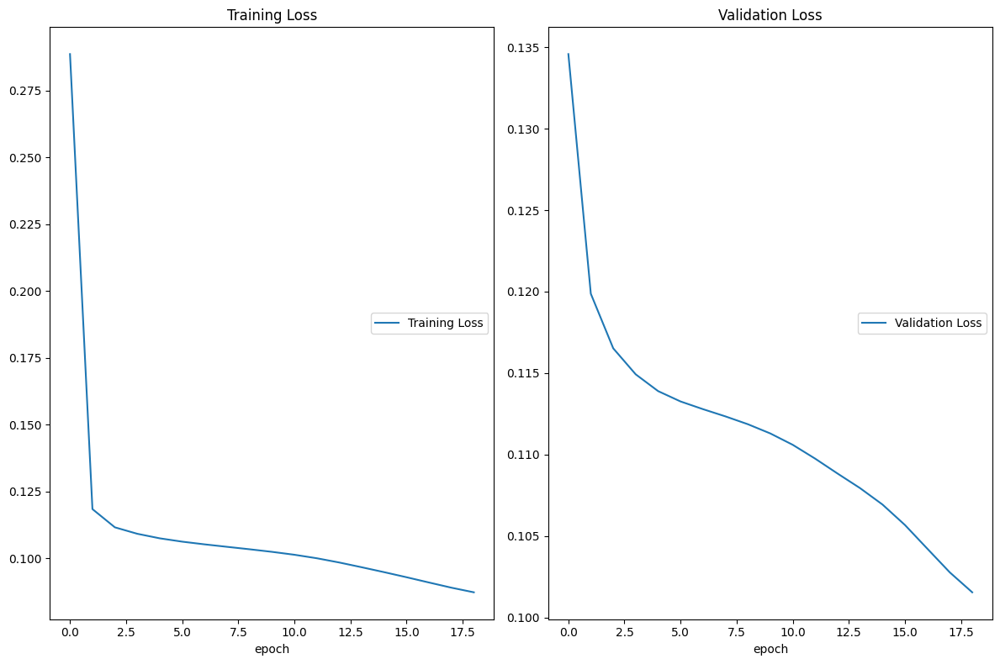

Training Loss
	Training Loss    	 (min:    0.087, max:    0.289, cur:    0.087)
Validation Loss
	Validation Loss  	 (min:    0.102, max:    0.135, cur:    0.102)
Epoch 19 - Training Loss: 0.087333, Validation Loss: 0.101542
Epoch 20/30


KeyboardInterrupt: 

In [51]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from livelossplot import PlotLosses  # Import live loss plotting library

# Define the LSTM model
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=2):
        super(LSTMModel, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers

        # LSTM layer
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True, bidirectional=True)

        # Fully connected layer to map LSTM output to the desired output size
        self.fc = nn.Linear(hidden_size * 2, output_size)

    def forward(self, x):
        # Initialize hidden and cell states with zeros
        h0 = torch.zeros(self.num_layers * 2, x.size(0), self.hidden_size).to(x.device)  # Hidden state
        c0 = torch.zeros(self.num_layers * 2, x.size(0), self.hidden_size).to(x.device)  # Cell state

        # Forward propagate through LSTM
        out, _ = self.lstm(x, (h0, c0))  # out: tensor of shape (batch_size, seq_length, hidden_size)

        # Map the LSTM output to the desired output size
        out = self.fc(out)  # out: tensor of shape (batch_size, seq_length, output_size)
        return out

# Function to train the model with training and validation loss tracking
def train_model_with_validation(model, train_dataloaders, val_dataloader, criterion, optimizer, num_epochs=30):
    """
    Train the model and monitor both training and validation losses using live plotting.

    Parameters:
    - model: The LSTM model
    - train_dataloaders: List of DataLoaders for training
    - val_dataloader: DataLoader for validation
    - criterion: Loss function (e.g., MSELoss)
    - optimizer: Optimizer (e.g., Adam)
    - num_epochs: Number of training epochs

    Returns:
    - model: Trained model
    """
    liveloss = PlotLosses()  # Initialize live loss plot
    device = model.fc.weight.device

    for epoch in range(num_epochs):
        print(f"Epoch {epoch + 1}/{num_epochs}")
        model.train()  # Set model to training mode
        train_loss = 0.0
        train_samples = 0

        # Training Phase
        for dataloader_idx, dataloader in enumerate(train_dataloaders):
            for corrupted_batch, uncorrupted_batch in dataloader:
                # Move data to device
                corrupted_batch = corrupted_batch.unsqueeze(1).to(device)
                uncorrupted_batch = uncorrupted_batch.unsqueeze(1).to(device)

                # Replace NaN values with 0
                corrupted_batch = torch.nan_to_num(corrupted_batch, nan=0.0)

                # Forward pass
                outputs = model(corrupted_batch)

                # Compute loss
                loss = criterion(outputs, uncorrupted_batch)

                # Backward pass and optimization
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                # Accumulate loss
                train_loss += loss.item() * corrupted_batch.size(0)
                train_samples += corrupted_batch.size(0)

        # Calculate average training loss
        avg_train_loss = train_loss / train_samples

        # Validation Phase
        model.eval()  # Set model to evaluation mode
        val_loss = 0.0
        val_samples = 0
        with torch.no_grad():
            for corrupted_batch, uncorrupted_batch in val_dataloader:
                corrupted_batch = corrupted_batch.unsqueeze(1).to(device)
                uncorrupted_batch = uncorrupted_batch.unsqueeze(1).to(device)

                # Replace NaN values with 0
                corrupted_batch = torch.nan_to_num(corrupted_batch, nan=0.0)

                # Forward pass
                outputs = model(corrupted_batch)

                # Compute loss
                loss = criterion(outputs, uncorrupted_batch)

                # Accumulate loss
                val_loss += loss.item() * corrupted_batch.size(0)
                val_samples += corrupted_batch.size(0)

        # Calculate average validation loss
        avg_val_loss = val_loss / val_samples

        # Update live plot with both training and validation losses
        liveloss.update({
            "Training Loss": avg_train_loss,
            "Validation Loss": avg_val_loss
        })
        liveloss.send()

        print(f"Epoch {epoch + 1} - Training Loss: {avg_train_loss:.6f}, Validation Loss: {avg_val_loss:.6f}")

    return model

# Initialize the model, loss function, and optimizer
input_size = len(columns)  # Number of input features
hidden_size = 128  # Size of the LSTM's hidden state
output_size = len(columns)  # Output size matches input size for reconstruction
num_layers = 2  # Number of LSTM layers

model = LSTMModel(input_size, hidden_size, output_size, num_layers)
criterion = nn.MSELoss()  # Reconstruction loss
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Split dataloaders: First two for training, last one for validation
train_dataloaders = dataloaders[:2]
val_dataloader = dataloaders[2]

# Train the model
model = train_model_with_validation(model, train_dataloaders, val_dataloader, criterion, optimizer, num_epochs=30)


# Data Agumentation

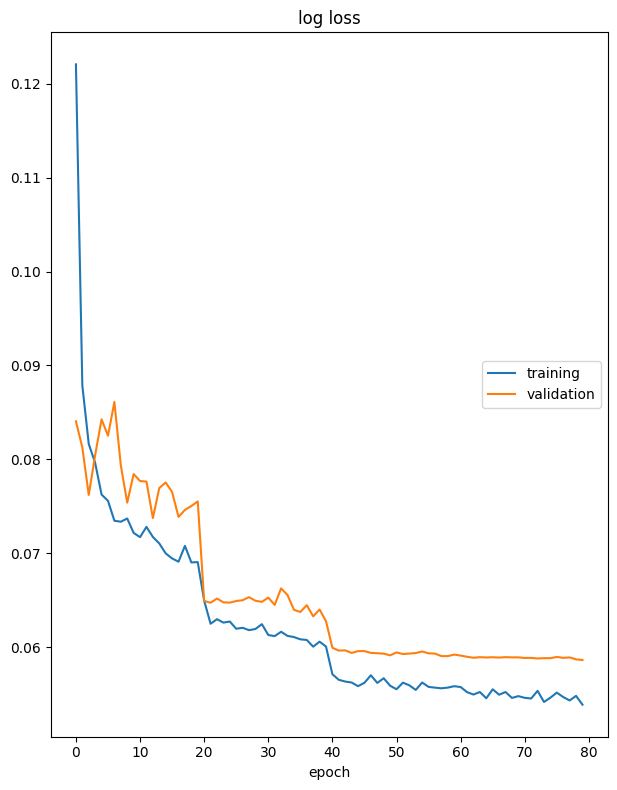

log loss
	training         	 (min:    0.054, max:    0.122, cur:    0.054)
	validation       	 (min:    0.059, max:    0.086, cur:    0.059)
Epoch 80 - Training Loss: 0.053873, Validation Loss: 0.058632


In [136]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from livelossplot import PlotLosses
import numpy as np

# ===============================
# Define the LSTM model with masking
# ===============================
class LSTMModelWithMasking(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=1, dropout=0.3):
        super(LSTMModelWithMasking, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers

        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True, dropout=dropout, bidirectional=True)
        self.fc = nn.Linear(hidden_size * 2, output_size)

    def forward(self, x, mask):
        # Ensure x has the correct shape (batch_size, seq_length, input_size)
        if x.dim() == 2:
            x = x.unsqueeze(1)

        h0 = torch.zeros(self.num_layers * 2, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers * 2, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out)
        out = out * mask.float() + x * (1 - mask.float())
        return out

# ===============================
# Define data augmentation functions
# ===============================
def jitter(data, jitter_ratio=0.05):
    shift = jitter_ratio * (data.max() - data.min())
    jitter_noise = (torch.rand_like(data) - 0.5) * 2 * shift
    return data + jitter_noise

def scaling(data, scaling_factor_range=(0.9, 1.1)):
    scaling_factor = torch.rand(data.size(0), 1, 1, device=data.device) * (
        scaling_factor_range[1] - scaling_factor_range[0]
    ) + scaling_factor_range[0]
    return data * scaling_factor

def time_warp(data, warp_ratio=0.1):
    seq_length = data.size(1)
    warp_adjustment = int(seq_length * warp_ratio)
    if warp_adjustment == 0:
        return data, 0
    if torch.rand(1).item() > 0.5:  # Stretch
        return torch.cat([data, torch.zeros_like(data[:, :warp_adjustment, :])], dim=1), warp_adjustment
    else:  # Compress
        return data[:, :-warp_adjustment, :], -warp_adjustment

def augment_data(data, uncorrupted, mask):
    if data.dim() == 2:
        data = data.unsqueeze(1)
        uncorrupted = uncorrupted.unsqueeze(1)
        mask = mask.unsqueeze(1)

    augmented_data = jitter(data)
    augmented_data = scaling(augmented_data)
    augmented_data, warp_adjustment = time_warp(augmented_data)

    if warp_adjustment > 0:  # Stretch
        uncorrupted = torch.cat([uncorrupted, torch.zeros_like(uncorrupted[:, :warp_adjustment, :])], dim=1)
        mask = torch.cat([mask, torch.zeros_like(mask[:, :warp_adjustment, :])], dim=1)
    elif warp_adjustment < 0:  # Compress
        uncorrupted = uncorrupted[:, :warp_adjustment, :]
        mask = mask[:, :warp_adjustment, :]

    return augmented_data, uncorrupted, mask

# ===============================
# Define mask creation function
# ===============================
def create_mask(data, mask_value=-10.0):
    return torch.isnan(data) | (data == mask_value)

# ===============================
# Define training function with augmentation
# ===============================
def train_model_with_augmentation(model, train_dataloaders, val_dataloader, criterion, optimizer, scheduler, num_epochs=10):
    liveloss = PlotLosses()
    device = next(model.parameters()).device

    for epoch in range(num_epochs):
        print(f"Epoch {epoch + 1}/{num_epochs}")
        model.train()
        train_loss = 0.0
        train_samples = 0

        for dataloader_idx, dataloader in enumerate(train_dataloaders):
            for corrupted_batch, uncorrupted_batch in dataloader:
                corrupted_batch = corrupted_batch.to(device)
                uncorrupted_batch = uncorrupted_batch.to(device)

                if corrupted_batch.dim() == 2:
                    corrupted_batch = corrupted_batch.unsqueeze(1)
                    uncorrupted_batch = uncorrupted_batch.unsqueeze(1)

                mask = create_mask(corrupted_batch, mask_value=0.0)
                corrupted_batch = torch.nan_to_num(corrupted_batch, nan=0.0)

                augmented_batch, augmented_uncorrupted, augmented_mask = augment_data(
                    corrupted_batch, uncorrupted_batch, mask
                )

                outputs = model(augmented_batch, augmented_mask)
                loss = criterion(outputs * augmented_mask.float(), augmented_uncorrupted * augmented_mask.float())

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                train_loss += loss.item() * augmented_batch.size(0)
                train_samples += augmented_batch.size(0)

        avg_train_loss = train_loss / train_samples

        model.eval()
        val_loss = 0.0
        val_samples = 0
        with torch.no_grad():
            for corrupted_batch, uncorrupted_batch in val_dataloader:
                corrupted_batch = corrupted_batch.to(device)
                uncorrupted_batch = uncorrupted_batch.to(device)

                if corrupted_batch.dim() == 2:
                    corrupted_batch = corrupted_batch.unsqueeze(1)
                    uncorrupted_batch = uncorrupted_batch.unsqueeze(1)

                mask = create_mask(corrupted_batch, mask_value=0.0)
                corrupted_batch = torch.nan_to_num(corrupted_batch, nan=0.0)

                outputs = model(corrupted_batch, mask)
                loss = criterion(outputs * mask.float(), uncorrupted_batch * mask.float())

                val_loss += loss.item() * corrupted_batch.size(0)
                val_samples += corrupted_batch.size(0)

        avg_val_loss = val_loss / val_samples

        # Update and draw liveloss
        logs = {}
        logs['log loss'] = avg_train_loss
        logs['val_log loss'] = avg_val_loss
        liveloss.update(logs)
        liveloss.send()

        print(f"Epoch {epoch + 1} - Training Loss: {avg_train_loss:.6f}, Validation Loss: {avg_val_loss:.6f}")

        # Step the scheduler
        scheduler.step()

    return model

# ===============================
# Example usage (ensure your dataloaders and columns are properly defined)
# ===============================
input_size = len(columns)  # Number of input features
hidden_size = 256
output_size = len(columns)
num_layers = 4
dropout = 0.5

model = LSTMModelWithMasking(input_size, hidden_size, output_size, num_layers, dropout)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.005, weight_decay=1e-5)

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=20, gamma=0.25) #(20, 0.1)

train_dataloaders = dataloaders[:2]
val_dataloader = dataloaders[2]

model = train_model_with_augmentation(model, train_dataloaders, val_dataloader, criterion, optimizer, scheduler, num_epochs=80) #80


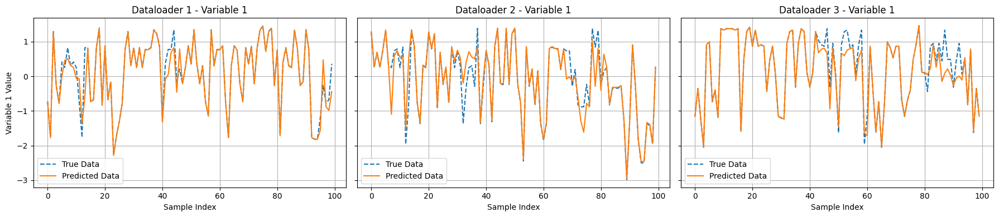

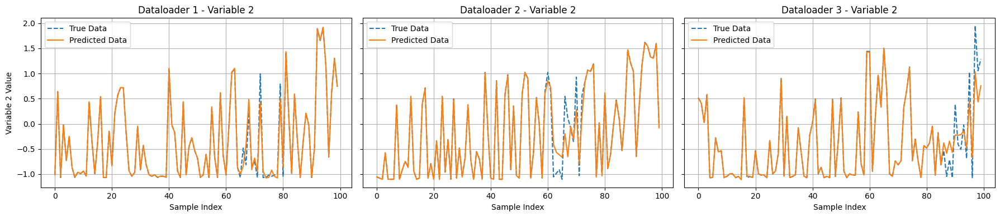

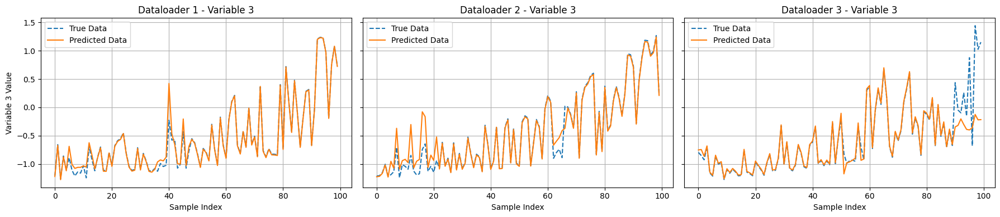

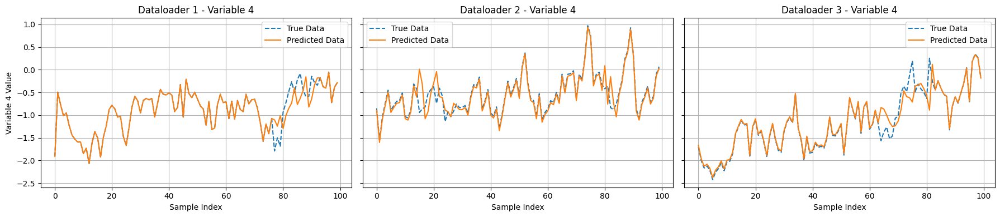

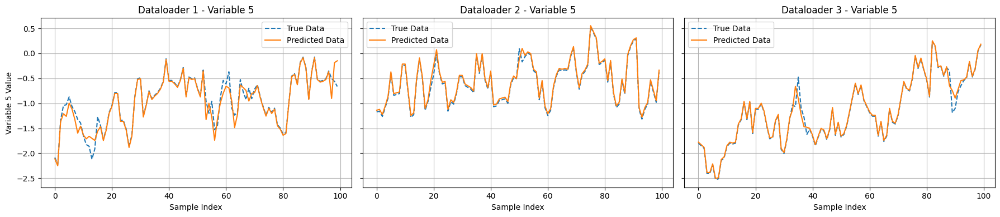

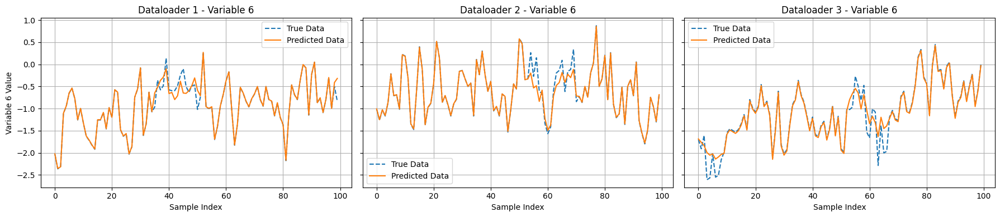

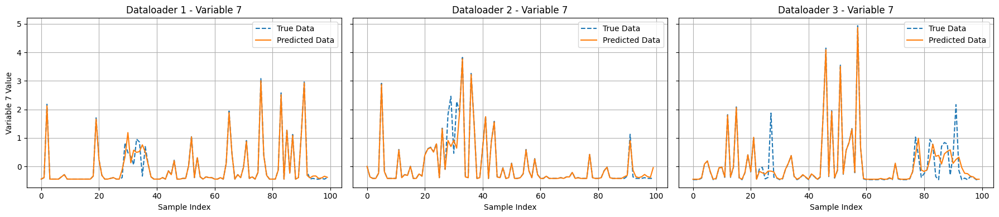

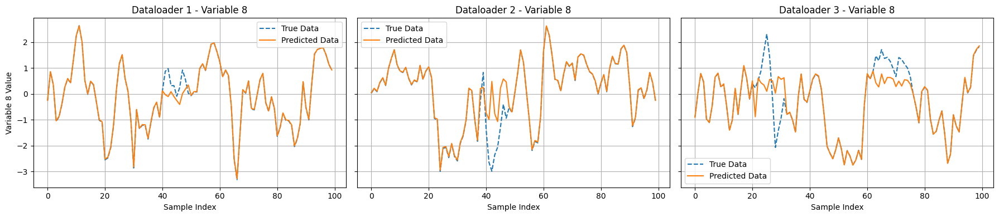

In [137]:
plot_predictions(model.to('cpu'), train_dataloaders + [val_dataloader], num_samples=100)

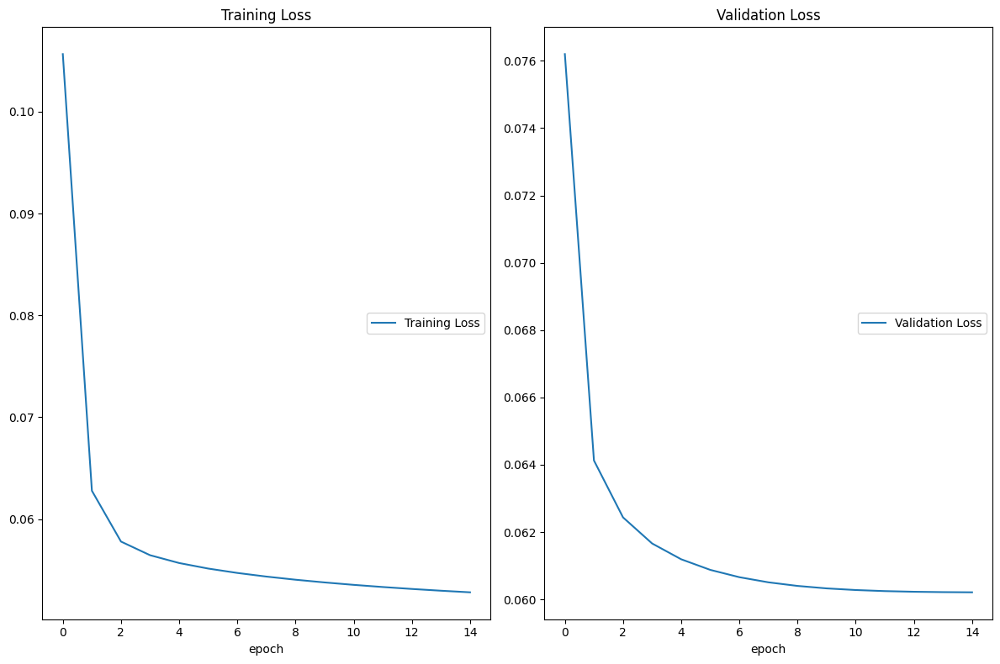

Training Loss
	Training Loss    	 (min:    0.053, max:    0.106, cur:    0.053)
Validation Loss
	Validation Loss  	 (min:    0.060, max:    0.076, cur:    0.060)
Epoch 15 - Training Loss: 0.052806, Validation Loss: 0.060209
{'hidden_size': 64, 'num_layers': 1, 'learning_rate': 0.001, 'weight_decay': 0.0, 'dropout': 0.0}


In [38]:
import random
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np

# Assume we have the following variables and functions defined:
# - columns: a list of the input features used in the model
# - dataloaders: a list of training/validation dataloaders
# - LSTMModelWithMasking: the model class defined above (with dropout parameter)
# - create_mask, train_model_with_masking, plot_predictions: functions defined above

# Hyperparameter search space
param_distributions = {
    'hidden_size': [64, 128, 256],
    'num_layers': [1, 2, 4],
    'learning_rate': [0.001, 0.0001, 0.00001],
    'weight_decay': [1e-5, 1e-6, 0.0],
    'dropout': [0.0, 0.1, 0.3]
}

def random_search(num_iterations=5, num_epochs=15):
    """
    Perform a random search for the best hyperparameters by randomly sampling
    from predefined distributions.

    Parameters:
    - num_iterations: How many random samples of hyperparameters to try
    - num_epochs: Number of epochs to train for each hyperparameter set

    Returns:
    - best_params: Dictionary of the best found hyperparameters
    - best_val_loss: The validation loss corresponding to the best hyperparameters
    """
    best_val_loss = float('inf')
    best_params = None

    # Split the dataloaders (assuming last one is validation)
    train_dataloaders = dataloaders[:2]
    val_dataloader = dataloaders[2]

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    for iteration in range(num_iterations):
        # Randomly sample hyperparameters
        sampled_params = {
            'hidden_size': random.choice(param_distributions['hidden_size']),
            'num_layers': random.choice(param_distributions['num_layers']),
            'learning_rate': random.choice(param_distributions['learning_rate']),
            'weight_decay': random.choice(param_distributions['weight_decay']),
            'dropout': random.choice(param_distributions['dropout'])
        }

        print(f"\nRandom Search Iteration {iteration+1}/{num_iterations}")
        print("Sampled hyperparameters:", sampled_params)

        # Initialize model with sampled hyperparameters
        input_size = len(columns)
        output_size = len(columns)
        model = LSTMModelWithMasking(
            input_size,
            sampled_params['hidden_size'],
            output_size,
            num_layers=sampled_params['num_layers'],
            dropout=sampled_params['dropout']
        )

        model.to(device)

        # Initialize criterion and optimizer
        criterion = nn.MSELoss()
        optimizer = optim.Adam(model.parameters(), lr=sampled_params['learning_rate'], weight_decay=sampled_params['weight_decay'])

        # Train the model
        trained_model = train_model_with_masking(model,
                                                 train_dataloaders,
                                                 val_dataloader,
                                                 criterion,
                                                 optimizer,
                                                 num_epochs=num_epochs)

        # Evaluate on the validation set
        trained_model.eval()
        val_loss = 0.0
        val_samples = 0
        with torch.no_grad():
            for corrupted_batch, uncorrupted_batch in val_dataloader:
                corrupted_batch = corrupted_batch.unsqueeze(1).to(device)  # Add sequence dimension
                uncorrupted_batch = uncorrupted_batch.unsqueeze(1).to(device)

                mask = create_mask(corrupted_batch, mask_value=0.0)
                corrupted_batch = torch.nan_to_num(corrupted_batch, nan=0.0)

                outputs = trained_model(corrupted_batch, mask)
                loss = criterion(outputs * mask.float(), uncorrupted_batch * mask.float())
                val_loss += loss.item() * corrupted_batch.size(0)
                val_samples += corrupted_batch.size(0)

        avg_val_loss = val_loss / val_samples
        print(f"Validation Loss for this config: {avg_val_loss:.6f}")

        # Check if this is the best so far
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            best_params = sampled_params

    print("\nBest Hyperparameters found:")
    print(best_params)
    print("With Validation Loss:", best_val_loss)

    return best_params, best_val_loss


# Example usage:
best_params, best_val_loss = random_search(num_iterations=10, num_epochs=15)

# After identifying the best parameters, you can retrain the model with them and then plot predictions:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

best_model = LSTMModelWithMasking(
    input_size=len(columns),
    hidden_size=best_params['hidden_size'],
    output_size=len(columns),
    num_layers=best_params['num_layers'],
    dropout=best_params['dropout']
)

best_model.to(device)

optimizer = optim.Adam(best_model.parameters(), lr=best_params['learning_rate'], weight_decay=best_params['weight_decay'])
criterion = nn.MSELoss()

train_dataloaders = dataloaders[:2]
val_dataloader = dataloaders[2]

best_model = train_model_with_masking(best_model, train_dataloaders, val_dataloader, criterion, optimizer, num_epochs=15)

print(best_params)

